#COMP/BUSI 488 Team Assignment 3

*Delta 2: Francisco Cantu, Pranith Koppula, Shannan Foster, Ali Yousuf, Hannah Keel, Jay Sheth*

## Business Problem

With the coronavirus pandemic, it is hard for people to social distance and feel safe in small enclosed spaces. The rideshare business, we suspected, could have a lot of negative sentiment right now because people are concerned with their safety during this public health crisis. Uber, in particular, is a huge company with drivers all over the world. How are their customers and drivers feeling? What can Uber do to accomodate for these unprecedented times?

##Collecting Data on Uber

### Scraping Commands

Here are some of the commands we tried and the issues that arose with these. Go to the Used Commands tab to see which ones we decided on and are using for our analysis.

We scraped 400000 tweets starting Feb 1st 2020-until April 14th 2021 that contained Uber but not the words Eats and put this in uber.json

 `snscrape --jsonl --progress --max-results 400000 --since 2020-02-1 twitter-search "Uber NOT Eats lang:en until:2021-04-14" > uber.json`

This did not filter out eats and did not give us data from our entire timeframe. It gave us data in reverse chronological order. The file also took up way to much storage on google drive.

Next we tried setting the max results lower so the file did not take up all of our google storage. This only gave us two months worth of data which we did not think would accomplish our goal of looking into Uber tweets during the coronavirus pandemic.

 `snscrape --jsonl --progress --max-results 200000 --since 2020-02-1 twitter-search "Uber lang:en until:2021-04-14" > uber200k.json`

**Overall notes:**
*   Another Scrape we could have done is set the 
location to the US but there are some warnings associated with this and also Uber operates in many countries outside of the US so maybe we shouldn't limit it.
*   We set the dates based on the first US case as reported by cdc.org. On their website they say Feb 2020 so that's what we set our "since" date to.

### Used Commands

**This command scrapes all tweets containing the keyword "Uber" from Feb 2020 - April 14th 2021.**

`snscrape --jsonl --progress --since 2020-02-1 twitter-search "Uber lang:en until:2021-04-14" > uberAllTweets.json`

From here, the file was way too large to add to google drive so we used jupyter notebook to locally take a sample of 200k tweets from uberAllTweets.json. We also stopped the scraping once it got to August 2020 because at that point it had been running for over 8 hours and the file was getting very large.

Code we ran in Jupyter notebook to do this:
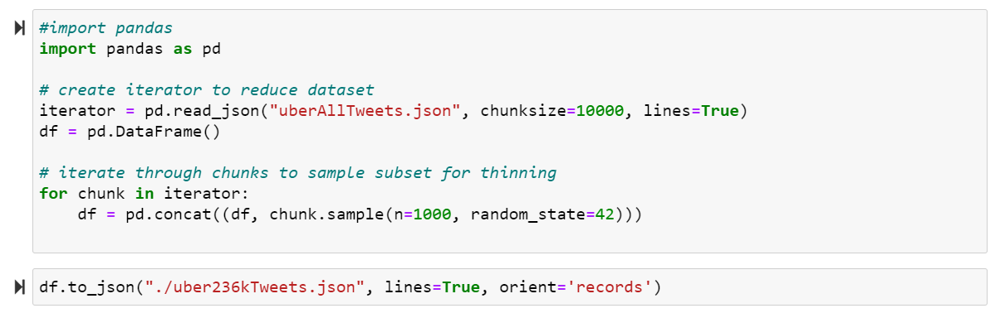



**Takeaways**


*   The date is set from the first US case of coronavirus according to cdc.org to when we began the assignment.
*   Ideally, snscrape would have had some "random" keyword or feature that could have scraped a "random" 200k tweets from our given timeline. 
    * We submitted an issue form on their github repo and they said that this feature is unfortunately unable to be implemented until twitter added a search operator similar to that (which is very unlikely so this feature will probably never be added).
    * We discussed scraping about 10k tweets by each month and then adding them to the same json file but this would only get the tweets from the end of the month and seemed more computationally time consuming compared to the scraping command we decided to go with.
*   We had to stop scraping once we got to 2,400,000 tweets because the file was getting too large and I was worried about working with it even in jupyter notebook. We ended up scraping tweets from Aug 2020 - April 14th 2021
*    We had to read the data in chunks because the file was too big to read all at once. This also helped us get a random sample pretty evenly over our timeframe of August 2020 - April 2021




## Competitors

###Mobility

Our Mobility offering competes with personal vehicle ownership and usage, which accounts for the majority of passenger miles in the markets that we serve, and traditional transportation services, including taxicab companies and taxi-hailing services, livery and other car services. In addition, public transportation can be a superior substitute to our Mobility offering and in many cases, offers a faster and lower-cost travel option in many cities. We also compete with other ridesharing companies, including certain of our minority-owned affiliates, for drivers and riders, including Lyft, Didi, OLA, Bolt, and our Yandex.Taxi joint venture.

Uber Competitors (from 10-K filing MD&A portion)

### Lyft

After looking at word clouds on Uber, we realized Lyft was their big competitor. Also from outside knowledge and resources we felt that Lyft and Uber were competitors.

#### Collecting Data on Lyft

Using the same Twitter environment made when scraping tweets with the keyword "Uber", we will now scrape tweets with the keyword "Lyft".

This command scrapes all tweets containing the keyword "Lyft" from Feb 2020 - April 14th 2021.

`snscrape --jsonl --progress --since 2020-08-1 twitter-search "Lyft lang:en until:2021-04-14" > lyftAllTweets.json`

From here, the file was way too large to add to google drive so we used jupyter notebook to locally take a sample of 114k tweets from lyftAllTweets.json.

Code we ran in Jupyter notebook to do this:

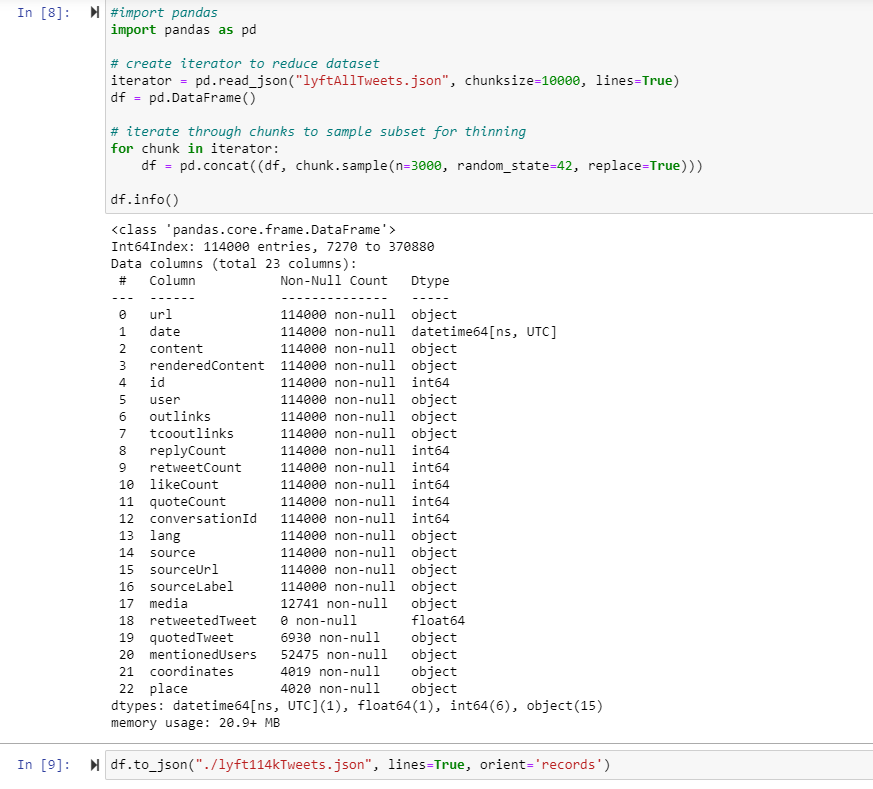

**Notes:**


*   We only sampled 114k tweets from Lyft to keep our file size low for google storage. Since our main focus is Uber we assumed this would be enough data for our purposes.



##Data Exploration & Analysis

####Import and Install necessary packages

In [ ]:
#Import and Install necessary packages
from google.colab import drive
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import math
from wordcloud import WordCloud
import matplotlib.dates as mdate
import spacy
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import itertools
from collections import Counter
import tensorflow as tf
import tensorflow_hub as hub
!pip install vaderSentiment
!pip3 install tweet-preprocessor
import preprocessor as prepro
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.ensemble import IsolationForest
from sklearn.cluster import KMeans
import sklearn.metrics.pairwise
from sklearn.manifold import TSNE
import altair as alt

     |████████████████████████████████| 133kB 9.2MB/s 


####Mount drive and preview Uber and Lyft Tweets

In [ ]:
# Connect your Google Drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive/delta2_assignment3
!ls # special shell command to view the files in the home directory of the notebook environment

Mounted at /content/gdrive
/content/gdrive/MyDrive/delta2_assignment3
 488-Spring2021-Section002-TeamDelta2.gslides
'Copy of Subgroup 2.ipynb'
'Final Notebook.ipynb'
'Hannah + Jay.ipynb'
 lyft114kTweets.json
'Meeting Agendas.gdoc'
 page_views_barplot.png
 Subgroup-1.ipynb
'Subgroup 2.ipynb'
'Topic Sentiment Over Time.ipynb'
 uber236kTweets.json


In [ ]:
# Load Uber Tweets and inspect
pd.set_option('max_colwidth', 20)
allUberTweets = pd.read_json('uber236kTweets.json', lines=True)
allUberTweets.tail()

,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,retweetCount,likeCount,quoteCount,conversationId,lang,source,sourceUrl,sourceLabel,media,retweetedTweet,quotedTweet,mentionedUsers,coordinates,place
235995,https://twitter....,2020-08-19 21:09:46,@Popehat Uber wa...,@Popehat Uber wa...,1296192659459944448,{'username': 'st...,[],[],0,0,11,0,1296190032152207360,en,"<a href=""http://...",http://twitter.c...,Twitter for iPhone,None,NaN,None,[{'username': 'P...,None,None
235996,https://twitter....,2020-08-19 22:32:53,@AQualityMess We...,@AQualityMess We...,1296213574294147082,{'username': 'Ub...,[],[],1,0,0,0,1296207722766098434,en,"<a href=""https:/...",https://www.spri...,Sprinklr,None,NaN,None,[{'username': 'A...,None,None
235997,https://twitter....,2020-08-19 21:14:12,@MayorofNight @g...,@MayorofNight @g...,1296193775157612551,{'username': 'Os...,[],[],0,0,0,0,1296008619264221186,en,"<a href=""https:/...",https://mobile.t...,Twitter Web App,None,NaN,None,[{'username': 'M...,None,None
235998,https://twitter....,2020-08-19 21:23:43,@PhilipFromyer W...,@PhilipFromyer W...,1296196169937367040,{'username': 'Ub...,[],[],0,0,0,0,1296195400018337800,en,"<a href=""https:/...",https://www.spri...,Sprinklr,None,NaN,None,[{'username': 'P...,None,None
235999,https://twitter....,2020-08-19 22:17:37,@jggarconn @Uber...,@jggarconn @Uber...,1296209733167337475,{'username': 'He...,[],[],1,0,0,0,1296193516637499392,en,"<a href=""http://...",http://twitter.c...,Twitter for iPhone,None,NaN,None,[{'username': 'j...,None,None


In [ ]:
# Load Lyft Tweets and inspect
pd.set_option('max_colwidth', 20)
allLyftTweets = pd.read_json('lyft114kTweets.json', lines=True)
allLyftTweets.tail()

,url,date,content,renderedContent,id,user,outlinks,tcooutlinks,replyCount,retweetCount,likeCount,quoteCount,conversationId,lang,source,sourceUrl,sourceLabel,media,retweetedTweet,quotedTweet,mentionedUsers,coordinates,place
113995,https://twitter....,2020-08-01 17:48:10,Texted my manage...,Texted my manage...,1289618943385116673,{'username': 'wi...,[],[],1,0,7,0,1289618943385116673,en,"<a href=""http://...",http://twitter.c...,Twitter for Android,None,NaN,None,None,None,None
113996,https://twitter....,2020-08-01 06:47:29,I Wanna Play Wit...,I Wanna Play Wit...,1289452675428306945,{'username': 'Kh...,[],[],5,0,20,1,1289452675428306945,en,"<a href=""http://...",http://twitter.c...,Twitter for iPhone,None,NaN,None,None,None,None
113997,https://twitter....,2020-08-01 22:10:27,I hope it's safe...,I hope it's safe...,1289684948505354240,{'username': 'Ti...,[],[],0,0,2,0,1289684948505354240,en,"<a href=""https:/...",https://mobile.t...,Twitter Web App,None,NaN,None,None,None,None
113998,https://twitter....,2020-08-01 05:18:43,"LMAO, my Lyft dr...","LMAO, my Lyft dr...",1289430337471176706,{'username': 'Wh...,[https://twitter...,[https://t.co/T7...,0,1,0,0,1289430337471176706,en,"<a href=""http://...",http://twitter.c...,Twitter for iPhone,None,NaN,{'url': 'https:/...,None,None,None
113999,https://twitter....,2020-08-01 13:30:24,@best_referral @...,@best_referral @...,1289554071762984960,{'username': 'Ri...,[],[],0,0,0,0,1289549195624374272,en,"<a href=""http://...",http://twitter.c...,Twitter for Android,[{'previewUrl': ...,NaN,None,[{'username': 'b...,None,None


###Cleaning

####Filter relevant columns

In [ ]:
# Keep only certain columns
uberTweets = allUberTweets.filter(['id','content','date', 'user', 'retweetCount', 'likeCount'], axis=1)

# We want to see as much of the columns as possible:
pd.set_option('max_colwidth', 400)

# Let's take a look
display(uberTweets.head(10))
display(uberTweets.info())

,id,content,date,user,retweetCount,likeCount
0,1381973916499984389,"In 1935, Channing Tatum starts their first job as an Uber driver, but things aren't so simple when a suspicious cheese shows up in the tanning bed, with Jennifer Connelly arouseing the role of a king. (☆☆☆☆☆)",2021-04-13 14:13:52,"{'username': 'MovieReviewBot2', 'displayname': 'Movie Review Robot', 'id': 1105484542649851905, 'description': 'A Twitter bot created by Evan Swope and Xhavier Jacobsen. I can't stop reviewing all these great (or not so great) movies. Reply to a tweet to learn the title!', 'rawDescription': 'A Twitter bot created by Evan Swope and Xhavier Jacobsen. I can't stop reviewing all these great (or n...",0,0
1,1382009320016113667,@UberEats Why is it so HARD to speak to a customer service agent through your app? It's frustrating to deal with your customer service through Twitter. @Uber @Uber_Support,2021-04-13 16:34:33,"{'username': 'ShraddhaForReal', 'displayname': 'Shraddha', 'id': 3009015158, 'description': 'Read more books. Write some poetry. And fly away 🌸 From Bombay, living in New Jersey. Currently reading: Being Mortal', 'rawDescription': 'Read more books. Write some poetry. And fly away 🌸 From Bombay, living in New Jersey. Currently reading: Being Mortal', 'descriptionUrls': [], 'verified': False, 'c...",2,0
2,1382074147946250248,Not Uber teaming up with 2 other LARGE corporations to get people access to vaccinations and still asking people to donate to help them like they aren’t already LARGE corporations smh 🙄,2021-04-13 20:52:09,"{'username': 'lauren_goodwin6', 'displayname': 'lauren🤘🏽', 'id': 1566798103, 'description': 'no such thing as a life that’s better than yours temple U🍒', 'rawDescription': 'no such thing as a life that’s better than yours temple U🍒', 'descriptionUrls': [], 'verified': False, 'created': '2013-07-03T21:59:19+00:00', 'followersCount': 335, 'friendsCount': 271, 'statusesCount': 11709, 'favouritesC...",0,4
3,1382008106335395842,"More than 27,000 Uber and Lyft drivers received a combined $80 million from the US government to help them get through the pandemic. https://t.co/TGjbL32sHl",2021-04-13 16:29:43,"{'username': 'CourialDelivery', 'displayname': 'Courial Delivery', 'id': 1381818124186476547, 'description': 'Courial is the courier platform for everything. Created by gig-workers for gig- workers.', 'rawDescription': 'Courial is the courier platform for everything. Created by gig-workers for gig- workers.', 'descriptionUrls': [], 'verified': False, 'created': '2021-04-13T03:55:12+00:00', 'fo...",0,0
4,1382012317160771586,People say dont invest in Uber but time and time that front office must be elite cause they continue to impress me https://t.co/nI364yi6Nu,2021-04-13 16:46:27,"{'username': 'Living0od', 'displayname': '🇩🇴🥑', 'id': 122544154, 'description': 'instagram.com/living0od Parody Account Tiktok account : @haisellheredia', 'rawDescription': 'https://t.co/0zGLq6oeFw Parody Account Tiktok account : @haisellheredia', 'descriptionUrls': [{'text': 'instagram.com/living0od', 'url': 'http://instagram.com/living0od', 'tcourl': 'https://t.co/0zGLq6oeFw', 'indices':...",0,10
5,1381971260863827969,"Dudes. Beer. BBQ\nWe donut think there can be a better weekend than this! Just look at how much fun these two are having! So what are you waiting for? Go, get yourself and your bros these uber-cool prints now. \n\nShop our fun all-over-print #pajama shorts on https://t.co/XZoZZaT2nm https://t.co/hESgeATtCM",2021-04-13 14:03:19,"{'username': 'RockAtoll', 'displayname': 'Rock Atoll', 'id': 892753543727206400, 'description': 'Shop novelty print casual-wear, sleep & loungewear! Made in bold fresh limited edition all-over-prints, we make colorful expressive apparel for men & women😎🏝️', 'rawDescription': 'Shop novelty print casual-wear, sleep & loungewear! Made in bold fresh limited edition all-over-prints, we make colorfu...",0,0
6,1382103529653899270,Found another OSS project that became inactive after original creator qu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236000 entries, 0 to 235999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            236000 non-null  int64         
 1   content       236000 non-null  object        
 2   date          236000 non-null  datetime64[ns]
 3   user          236000 non-null  object        
 4   retweetCount  236000 non-null  int64         
 5   likeCount     236000 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 10.8+ MB


None

In [ ]:
# Keep only certain columns
lyftTweets = allLyftTweets.filter(['id','content','date', 'user', 'retweetCount', 'likeCount'], axis=1)

# We want to see as much of the columns as possible:
pd.set_option('max_colwidth', 400)

# Let's take a look
display(lyftTweets.head(10))
display(lyftTweets.info())

,id,content,date,user,retweetCount,likeCount
0,1380288217644212224,@VamosYankees @lyft @AskLyft @Uber Damn..that's crazy. I'm sorry that happened to you. I took uber home.,2021-04-08 22:35:30,"{'username': 'tyffmariedadiva', 'displayname': 'Tiffany 💋', 'id': 96662260, 'description': 'Im Tyff. LP:5. #INFJ-T ♎🌞♓🌚♐ Rising. #SquadUp #NYG', 'rawDescription': 'Im Tyff. LP:5. #INFJ-T ♎🌞♓🌚♐ Rising. #SquadUp #NYG', 'descriptionUrls': [], 'verified': False, 'created': '2009-12-14T01:03:22+00:00', 'followersCount': 1991, 'friendsCount': 1796, 'statusesCount': 186918, 'favouritesCount': 7, 'l...",0,1
1,1381971685759324167,Lyft Driver: I got a ping request. Around 2:15 a.m. I picked two men that appeared intoxicated in Old Town Scottsdale. One man got into the front seat the other got into the back seat.,2021-04-13 14:05:00,"{'username': 'StopVirtuaStalk', 'displayname': 'PSIVS', 'id': 1569393812, 'description': 'Prevent the Impact of Virtual Stalking's goal is to raise awareness through socialmedia activism.', 'rawDescription': 'Prevent the Impact of Virtual Stalking's goal is to raise awareness through socialmedia activism.', 'descriptionUrls': [], 'verified': False, 'created': '2013-07-05T00:46:32+00:00', 'foll...",0,0
2,1380740271407783938,Uber and lyft suck now,2021-04-10 04:31:48,"{'username': 'williamburdo', 'displayname': 'William Burdo', 'id': 459538966, 'description': 'Proper brainless yeh - isles', 'rawDescription': 'Proper brainless yeh - isles', 'descriptionUrls': [], 'verified': False, 'created': '2012-01-09T19:47:50+00:00', 'followersCount': 172, 'friendsCount': 602, 'statusesCount': 713, 'favouritesCount': 19891, 'listedCount': 0, 'mediaCount': 7, 'location': ...",1,3
3,1380811755882999811,"Uber, Lyft Provide Free Rides to Vaccine Websites for Clients in US https://t.co/ZzjomjPUMk",2021-04-10 09:15:51,"{'username': 'officialnewsors', 'displayname': 'Newsors', 'id': 1287791122002010112, 'description': 'Here on 'NEWSORS' social platform you can get authentic news explained in very simple/easy form... So keep visiting & sharing😁👍👍👍⁓ #100followback', 'rawDescription': 'Here on 'NEWSORS' social platform you can get authentic news explained in very simple/easy form... So keep visiting & sharing😁...",0,0
4,1380672344012689410,Played Egg by Mr Bungle at my mom's house on her laptop and she bought me a Lyft home immediately,2021-04-10 00:01:53,"{'username': 'buzzwo1e', 'displayname': '📣⚟ ON THE SKY', 'id': 1160026688941522944, 'description': 'SLATER 25 M || I like videogames & entomology & mecha || art: @battle_windows', 'rawDescription': 'SLATER 25 M || I like videogames & entomology & mecha || art: @battle_windows', 'descriptionUrls': [], 'verified': False, 'created': '2019-08-10T03:14:49+00:00', 'followersCount': 134, 'friendsCoun...",0,7
5,1380591132581756932,@afncwoodward @EminaMelonic Only my second time in a Lyft. I’m a regular cab customer.,2021-04-09 18:39:10,"{'username': 'MUGGER1955', 'displayname': 'Russ Smith', 'id': 22315241, 'description': 'Wrote the MUGGER column in New York Press. Now edits splicetoday.com', 'rawDescription': 'Wrote the MUGGER column in New York Press. Now edits http://t.co/qaDvokrbIO', 'descriptionUrls': [{'text': 'splicetoday.com', 'url': 'http://splicetoday.com', 'tcourl': 'http://t.co/qaDvokrbIO', 'indices': [53, 75]}], ...",1,3
6,1382034871942578179,"Booking a ride with Uber or Lyft is easy and convenient, but what happens if the driver has a car accident? Learn how to protect your rights and receive the compensation you deserve.\nhttps://t.co/XK6StSnPou\n\n#accidentlawyer #callSam #uberaccident https://t.co/assaR5GO5x",2021-04-13 18:16:05,"{'username': 'CallSam', 'displayname': 'The Sam Bernstein Law Firm', 'id': 431113980, 'description': 'The Sam Bernstein Law Firm - A leading personal injury law firm helping accident victims since 1970. Get the Bernstein Advantage Today!', 'rawDescription': 'The Sam Bernstein Law Firm - A leading personal injury law firm helping accident victims since 1970. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            114000 non-null  int64         
 1   content       114000 non-null  object        
 2   date          114000 non-null  datetime64[ns]
 3   user          114000 non-null  object        
 4   retweetCount  114000 non-null  int64         
 5   likeCount     114000 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 5.2+ MB


None

####Pre-process tweets

In [ ]:
#Set options to remove URL, Reserved word
prepro.set_options(prepro.OPT.URL, prepro.OPT.RESERVED, prepro.OPT.MENTION, prepro.OPT.HASHTAG)


uberTweets['text']  = uberTweets['content'].apply(prepro.clean)
lyftTweets['text'] = lyftTweets['content'].apply(prepro.clean)

# Check our work
uberTweets['text'].tail(5)

235995                                                                                                                                                   Uber was actually one of the world’s best engines for sexually harassing staff and thus and such
235996    We definitely want to get this sorted out. A member of our team has recently been in touch. Please check this message in-app as well as in your email. Please be sure to check your spam &amp; junk folders in case the message ended up there.
235997                                                                                                                                                                                                                                       Prangs R Us.
235998                                                                                                            We'd like to look into this. Please send us a DM with the phone number associated with your Uber account, so we can assist you further.


####Remove Undesirable Characters and Strings


Tweets can contain a range of characters, words, and strings that do not add value to our analysis. These include:



*   Reserved Words like RT and FAV
*   URLs
*   Pictures
*   Hashtags #
*   Mentions @
*   HTML entities, e.g.: &amp;

Let's remove them before we proceed with our analysis

In [ ]:
# Set-up patterns to be removed fro the tweets
pat1 = r"http\S+"
pat2 = r"#"
pat3 = r"@"
pat4 = r"FAV"
pat5 = r"RE"
pat6 = r"pic.\S+"
pat7 = r"\n"
pat8 = '\r\n'
pat9 = r'|'.join((r'&amp;',r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;'))

# Combine all patterns
combined_pat = r'|'.join((pat1, pat2, pat3, pat4, pat5, pat6, pat7, pat8, pat9))

# replace the patterns with an empty string
uberTweets['stripped'] =  [re.sub(combined_pat, '', w) for w in uberTweets.text]
lyftTweets['stripped']  =  [re.sub(combined_pat, '', w) for w in lyftTweets.text]

# might have double spaces now (because of empty string replacements above) - remove double empty spaces
uberTweets['stripped']  = [re.sub(r"  ", ' ', w) for w in uberTweets.loc[:,'stripped']]
lyftTweets['stripped']  = [re.sub(r"  ", ' ', w) for w in lyftTweets.loc[:,'stripped']]

# Print tweets - can change to lyftTweets if you want to check that
for i in range(340,352):
    print(uberTweets.stripped[i])
    print('\n')

All the drivers are steering the Tesla-Robotaxis in the one-lane, blinkenlights-infected sewage tunnel in Las Vegas. Sorry, Uber.


Nearly there.... Couldn't face the 950 bus with 3 kids and a case so Uber XL it is


Uber eats is as useless as Eskak (eskom) when they just cancel your order without a reason. Also not the first time.


man I need more friends who're into uber .


These patterned and *tactile* molds seem to have become the "goto" packaging for sparkling rose. ie. run in from the Uber, run along the shelf (while on the phone), pay and dash off to the party. Imported by Aldi Australia.


i mean uber will let anyone drive for them almost immediately so the range of quality of drivers is massive, and afaik uber doesnt try to cap how many drivers are allowed to be active in a given area, and i know doordash does since i sent an application and got left on read.


Hey I can totally relate every girl I've ever been with has said my massive cock was simply way too large for them 

#### Filter by likes

In [ ]:
#Only keep tweets with more than 1 like
uberTweets = uberTweets[uberTweets['likeCount'] > 1]
lyftTweets = lyftTweets[lyftTweets['likeCount'] > 1]

uberTweets.info()
lyftTweets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55135 entries, 2 to 235995
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            55135 non-null  int64         
 1   content       55135 non-null  object        
 2   date          55135 non-null  datetime64[ns]
 3   user          55135 non-null  object        
 4   retweetCount  55135 non-null  int64         
 5   likeCount     55135 non-null  int64         
 6   text          55135 non-null  object        
 7   stripped      55135 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 3.8+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26308 entries, 2 to 113997
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            26308 non-null  int64         
 1   content       26308 non-null  object        
 2   date    

#### Remove Duplicate Tweets

In [ ]:
# Our data may include the same tweet multiple times. 
# We will remove identical tweets for our analysis as follows:

print(uberTweets.shape)
uberTweets = uberTweets.drop_duplicates(subset='text', keep="first")
uberTweets = uberTweets.drop_duplicates(subset='id', keep="first")
print(uberTweets.shape)

(55135, 8)
(54614, 8)


In [ ]:
print(lyftTweets.shape)
lyftTweets = lyftTweets.drop_duplicates(subset='text', keep="first")
lyftTweets = lyftTweets.drop_duplicates(subset='id', keep="first")
print(lyftTweets.shape)

(26308, 8)
(21890, 8)


####Filter out tweets not about Uber the company

In [ ]:
# Let's try to identify tweets that are about the Ride Sharing Company
uberTweets['Company'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(car|cars|rider|rides|bars|drunk|drink|taxi|passenger|cab|location|phone|pick-up|drop-off|license|plate|insurance|gas|gas-stop|call|order|boycott|DUI|ride|$|giveaway|lyft|app|driver|drivers|bars|destination|location|rider|income|cashout|site|X|ridesharephone|rideshare|drove|riding|aux|seat|seats|company|business|trip|tip|wage|app|worker|price|account|prices|surge|service|customer|support|claim|account|vehicle|location|message)(?:$|\W)',       
    flags = re.IGNORECASE), 1, 0)

# I found out there is a film called Uber Goober released in 2004 that is about Gamers-- I'm using actors, directors and people associated with the film to spot tweets about it
uberTweets['Film'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(ÜberGoober|Über-Goober|ubergoober|uber-goober|Metze|Gygax)(?:$|\W)',                                                                                    
    flags = re.IGNORECASE), 1, 0)
 
# Identifying "Uber" used as an adverd to denote emphasis on something -- similar to the word "very"
uberTweets['Adverb'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(uber-talented|ubertalented|über-talented|uber-trendy|ubertrendy|über-trendy|uber-stylish|uberstylish|über-stylish|uber-popular|uberpopular|über-popular|uber-exited|überexited|uberexited|uber-angry|uberangry|über-angry|uber-disapointed|uberdisapointed|über-disapointed|uber-nerd|ubernerd|über-nerd|uber-cool|ubercool|über-cool|uber-dumb|uberdumb|über-dumb|uber-special|uberspecial|über-special|uber-weird|uberweird|über-weird|uber-scary|uberscary|über-scary|uber-priviledged|uber-fake|uberfake|über-fake|uber-nice|ubernice|über-nice|uber-democrat|uberdemocrat|uber-republican|uberepublican|uber-conservative|uberconservative|uber-libral|uberliberal|uber-chaotic|uberchaotic|über-chaotic|uberdramatic|uber-dramatic|über-dramatic|uber-intelligent|überintelligent|über-intelligent|uber-incompetent|uber-rich|rich|wealthy|uber-wealthy|uber-christian|uber-religious)(?:$|\W)',                                                                                 
    flags = re.IGNORECASE), 1, 0)

uberTweets['phraseAdverb'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(uber talented|uber trendy|uber stylish|uber wealthy|uber rich|uber religious|uber christian|uber popular|uber excited|uber angry|uber disappointed|uber cool|uber priviledged|uber fake|uber nice|uber democrat|uber republican|uber conservative|uber liberal|uber dramatic|uber intelligent|uber incompetent)(?:$|\W)',flags = re.IGNORECASE), 1, 0)

# How many tweets of each topic?
print(f"Total {uberTweets['Company'].count()}")
print(f"Company {uberTweets['Company'].sum()}")
print(f"Film {uberTweets['Film'].sum()}")
print(f"Adverb {uberTweets['Adverb'].sum()}")
print(f"phraseAdverb {uberTweets['phraseAdverb'].sum()}")

/usr/local/lib/python3.7/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


Total 54614
Company 42203
Film 0
Adverb 1185
phraseAdverb 1282


In [ ]:
# Show tweets with their repsective topic labels
pd.set_option('display.max_colwidth', None)
uberTweets[['stripped','Company','Film','Adverb', 'phraseAdverb']].head(25) 

,stripped,Company,Film,Adverb,phraseAdverb
2,Not Uber teaming up with 2 other LARGE corporations to get people access to vaccinations and still asking people to donate to help them like they aren’t already LARGE corporations smh 🙄,1,0,0,0
4,People say dont invest in Uber but time and time that front office must be elite cause they continue to impress me,0,0,0,0
6,Found another OSS project that became inactive after original creator quit/ uber/manifold: A model-agnostic visual debugging tool for machine learning,0,0,0,0
10,How do you stop these uber eats emails?,1,0,0,0
20,"ERM. No. I like that she's frying the gov, but she's still uber conservatismos.",1,0,0,0
30,I saved $9 on Uber eats by up my own food around the corner 😂,1,0,0,0
38,Yall go read FaB,0,0,0,0
40,So you're comparing scoring in la liga to uber eats league?🤣🤣🤣🤣,1,0,0,0
41,"I hate meth so much! I didn’t have a ride home, we were on an island! There’s no Uber back then. This was me the whole way home!",1,0,0,0
43,"The aren’t in charge. The elites are. Pushing through a vile agenda for the Uber rich, taking back control over U.K. citizens to exploit, creating mayhem in our covid response...and the Tories can only be well rewarded or compromised for allowing this.",1,0,1,1


In [ ]:
#we only want tweets about Uber the compnay
uberTweets = uberTweets[uberTweets['Film'] == 0]
uberTweets = uberTweets[uberTweets['Adverb'] == 0]
uberTweets = uberTweets[uberTweets['phraseAdverb'] == 0]

print(uberTweets['content'].sample(20))

107520                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     @ugogowakho The common denominator here is men. Not Uber, Bolt, or anyone else. Everything will be safer when men decide to behave like human beings.
151157                                                                                                                                                                 

####Filter out tweets about Uber Eats

In [ ]:
# Let's try to identify tweets that are about Uber Eats
uberTweets['eats'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(Eats|delivery|food|doordash|postmates|ubereats|deliver)(?:$|\W)', 
    flags = re.IGNORECASE), 1, 0)

#we only want tweets where eats is not mentioned
uberTweets = uberTweets[uberTweets['eats'] == 0]

print(uberTweets['content'].sample(20))

/usr/local/lib/python3.7/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


22990                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 idk how to explain it but if ur uber/lyft driver slaps their knees to the beat of a song, u just know ur abt to get ur destination so fast
131815                                                                                                                                                                                                                                                                                 

In [ ]:
display(uberTweets.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43525 entries, 2 to 235995
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            43525 non-null  int64         
 1   content       43525 non-null  object        
 2   date          43525 non-null  datetime64[ns]
 3   user          43525 non-null  object        
 4   retweetCount  43525 non-null  int64         
 5   likeCount     43525 non-null  int64         
 6   text          43525 non-null  object        
 7   stripped      43525 non-null  object        
 8   Company       43525 non-null  int64         
 9   Film          43525 non-null  int64         
 10  Adverb        43525 non-null  int64         
 11  phraseAdverb  43525 non-null  int64         
 12  eats          43525 non-null  int64         
dtypes: datetime64[ns](1), int64(8), object(4)
memory usage: 4.6+ MB


None

####Filter out tweets from Uber/Lyft accounts

We want to see customer sentiment so we need to filter out the tweets by uber themselves.

In [ ]:
#Let's try to identify tweets that are by the user Uber
uberTweets['Uberthemselves'] = np.where([re.search('Uber', t.get('username'), re.IGNORECASE) for t in uberTweets.user], 1, 0)

#we only want tweets where it is not by uber
uberTweets = uberTweets[uberTweets['Uberthemselves'] == 0]

print(uberTweets['content'].sample(20))

92849                                                                                                    Hey 🥺\nI sell things like this \nAnd they are pretty cheap for their authenticity \nThe makeup in each set is gotten from the company themselves \n🥺✨ please patronize me 🥺\n\nUber https://t.co/3PsY43DfEb
37686                                                                                                                                                                       And I know it’s a good morning because when I got into my Uber, the driver was playing “Rasputin” so...doesn’t get any better than that.
19245                                                         @cameronmonaghan @TheLegendOfMart @UberEats Exactly what happened to me. It’s hard because many do use this as a marketing strategy, but on some occasions, this will happen were its a scam. Hard to know really. I suggest running this up with Uber
219816                                                                   

In [ ]:
#Let's try to identify tweets that are by the user Lyft
lyftTweets['Lyftthemselves'] = np.where([re.search('Lyft', t.get('username'), re.IGNORECASE) for t in lyftTweets.user], 1, 0)

#we only want tweets where it is not by lyft
lyftTweets = lyftTweets[lyftTweets['Lyftthemselves'] == 0]

print(lyftTweets['content'].sample(20))

77794                                                                                                                                                                                                                                   Lyft drivers be so talkative bro it’s 8 in the morning
86694                                                                                                                                                                                               y’all still drinking &amp; driving ? grow the fuck up &amp; get your ass an uber or lyft 😤
73693                    Over 7️⃣0️⃣% of Uber and Lyft drivers work more than 30 hours per week. Prop 22 wouldn’t grant them more “flexibility” — it would take away the minimum wage, health benefits, and worker protections required under current law. #NoOnProp22 https://t.co/IsG1Ofl4G5
87075                                                                                                                                      

###Sentiment Analysis of Uber

In [ ]:
# Instantiate the sentiment analyzer
analyser = SentimentIntensityAnalyzer()

# Now get the compound sentiment score for each tweet
uberTweets['C_Score'] = np.nan
for index, row in uberTweets.iterrows(): 
    uberTweets.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']
# Let's take a look!
pd.set_option('display.max_colwidth', None)
uberTweets[['stripped','C_Score']][340:352]

,stripped,C_Score
2166,Just now 🧐 I randomly started Crying in My Uber 😢 the Driver up on it patiently talked to me about Change 😕 for a bit while I fumbled to get out of the car😌 I’m Gonna Miss the Hell Out of This City....💙💙💙💙,0.7512
2170,$UBER Uber Technologies shares are trading higher after the company announced March bookings reached the highest level in the company's history.,0.5861
2181,"Neatly used Corolla 2004, N1.6M. Perfect for Uber runs. Help me RT 🙏🏽. My buyer dey your TL.",0.8434
2184,Could be Uber or Lyft drivers.,0.0000
2185,"If you offer a direct Uber/Lyft competitor with a driver and sell your driver's real time insurance rates that incentivize autopilot use, you give a captive audience a front row seat to the future.",0.0000
2201,My usual thought while in Orlando traffic driving for Uber!,0.0000
2205,designated uber caller 😍,0.5070
2208,"I also remain a fan of Paul I Bigelow. Jr, the best kind of guy in the worst kind of times.",0.3400
2219,I think it’s best you just move out before Lewatle notices. Let me call you an Uber,0.6369
2225,I will NEVER forget the day I couldn’t get an Uber or Lyft after so I just said FUCK IT IMMA RUN! Back to my hotel from Raymond James Stadium. I’m a beast and DAMN PROUD OF IT! But in all my travels I’ve never NOT gotten a rental. NEVER AGAIN!,-0.4514


#####First impressions of sentiment

In [ ]:
print(f"Count positive tweets: {sum(uberTweets['C_Score'] > 0.05)}")
print(f"Count netural tweets: {uberTweets['C_Score'].between(-0.05, 0.05).sum()}")
print(f"Count negative tweets: {sum(uberTweets['C_Score'] < -0.05)}")
print(f"Total number of tweets: {uberTweets['C_Score'].count()}")
      
display(uberTweets.C_Score.describe())

Count positive tweets: 19022
Count netural tweets: 9423
Count negative tweets: 13334
Total number of tweets: 41779


count    41779.000000
mean         0.086438
std          0.506202
min         -0.996400
25%         -0.296000
50%          0.000000
75%          0.508100
max          0.999400
Name: C_Score, dtype: float64

#####Visualize sentiment

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Sentiment Distribution')]

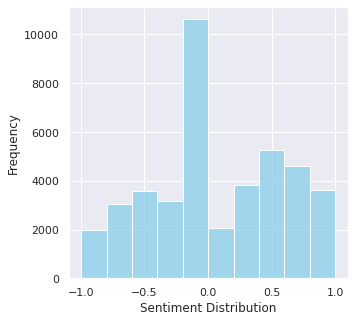

In [ ]:
# settings for seaborn plotting style
sns.set(color_codes=True)

# settings for seaborn plot sizes
sns.set(rc={'figure.figsize':(5,5)})

# Create Histogram
ax = sns.histplot(uberTweets['C_Score'],
                  bins=10,
                  kde=False,
                  color='skyblue')
ax.set(xlabel='Sentiment Distribution', ylabel='Frequency')

#####Categorize Sentiment

**Let's simplify our analysis** *by creating a new variable called* ***Sentiment*** that assumes the strings:
- **Postive** if the compound sentiment score (C_Score) is greater than 0.05
- **Negative** if the compound sentiment score (C_Score) is less than - 0.05
- **Neutral** if the compound sentiment score (C_Score) is between -0.05 and 0.05 (including both values)

In [ ]:
# create new column
uberTweets['Sentiment'] = np.nan

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in uberTweets.iterrows(): 
    if uberTweets.loc[index, 'C_Score'] > 0.05 : 
            uberTweets.loc[index, 'Sentiment'] = "Positive"       
    elif uberTweets.loc[index, 'C_Score'] < -0.05 :
            uberTweets.loc[index, 'Sentiment'] = "Negative"   
    else : 
        uberTweets.loc[index, 'Sentiment'] = "Neutral"

uberTweets['Sentiment'] = uberTweets['Sentiment'].astype("category")

In [ ]:
# See whether it worked 
uberTweets[['stripped','C_Score', 'Sentiment']].tail(25)

,stripped,C_Score,Sentiment
235885,They’ve known the law since before they launched. They weren’t complying with existing laws on the books. That’s in large part how they were profitable disrupters - they skirted laws eveyone rose complies with.,0.5267,Positive
235888,"Uber loses a lot of money, so it will use this labor law as an excuse to raise prices. It's completely bullshit that the law is the reason for hiking prices. The reason is because Uber underpriced its service to get market share.",-0.6353,Negative
235898,California checking in - Rolling blackouts - Churches banned - Rioting and looting allowed - Uber shuts down,-0.4588,Negative
235906,"Thank you for this. I really don't understand how Uber drivers = Uber employee. Do these people not understand the basic function of Uber? And it sounds like it's pretty much every freelancer in CA that's been screwed over by the AB5, but they're choosing to focus on Uber. 😤",0.4678,Positive
235908,"I hate when Uber drivers (who don’t know the way) THINK they know the way but take much longer than the actual GPS, because their vakils took them the wrong way, and then they decide to follow the GPS after they pote. If only you just followed it in the first place, mate 🤦🏽‍♀️",-0.7579,Negative
235909,"There's a systemic problem with California itself, not Uber.",-0.4019,Negative
235911,Uber and Lyft were on somewhat shaky legal ground and pursued a strategy of gaining market share by operating at a loss and now attempt to assert that market share in order to upend legal rulings they don't like.,0.4413,Positive
235913,"So if they license the Uber brand to fleet operators, they’re still likely to get a huge chunk of profits while maintaining the position of not being liable for drivers’ pay or benefits.",0.7506,Positive
235922,"Idk how long you haven't used the app, you can tip. 🤦🏼‍♂️",-0.1027,Negative
235932,uber drivers: *have jobs* bureaucrats: *make jobs illegal* uber drivers: *no longer have jobs* bureaucrats: *are shocked*,-0.7096,Negative


#####Visualize Categories

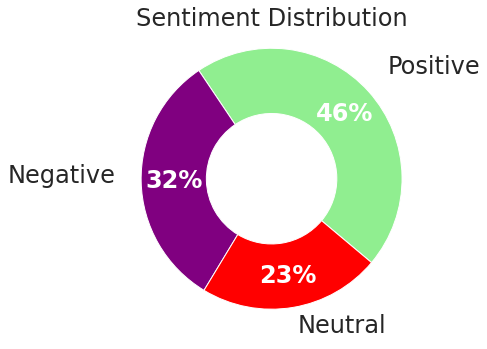

In [ ]:
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = uberTweets.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

#####Sentiment Categories Overtime

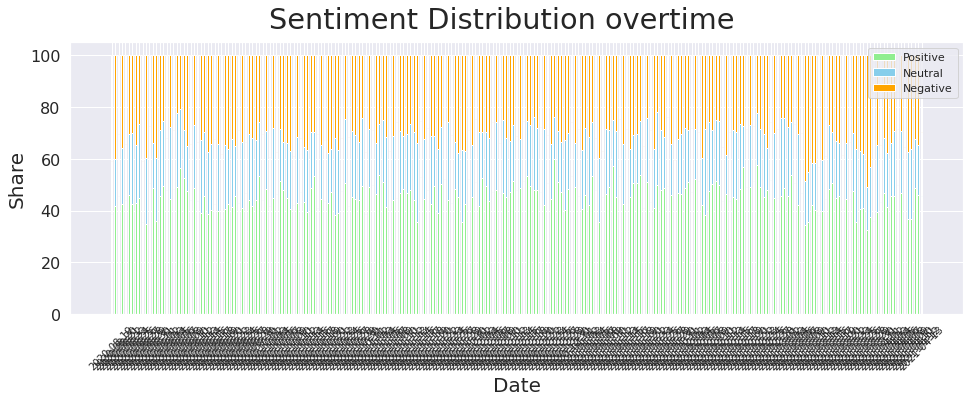

In [ ]:
uberTweets['day'] = [one.date() for one in uberTweets['date']]
uberTweets = uberTweets.sort_values(by=['day'])

sentiments = ["Positive", "Neutral", "Negative"]
positiveProps = (uberTweets[uberTweets.Sentiment == 'Positive'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
neutralProps = (uberTweets[uberTweets.Sentiment == 'Neutral'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
negativeProps = (uberTweets[uberTweets.Sentiment == 'Negative'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
 
positiveProps = positiveProps['Sentiment'].tolist()
neutralProps = neutralProps['Sentiment'].tolist()
negativeProps = negativeProps['Sentiment'].tolist()
plt.figure(figsize=[16, 5])
barWidth = 0.5
labels = uberTweets.day.unique()
r = np.arange(len(labels))
positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.bar(r,positiveProps, color='lightgreen', edgecolor='white', width=barWidth)
plt.bar(r, neutralProps, bottom=positiveProps, color='skyblue', edgecolor='white', width=barWidth)
plt.bar(r, negativeProps, bottom=[i+j for i,j in zip(positiveProps, neutralProps)], color='orange', edgecolor='white', width=barWidth)
 
plt.xticks( r, labels, rotation = 45, fontsize=10)
plt.yticks(fontsize=16)
plt.suptitle('Sentiment Distribution overtime')
plt.xlabel("Date", fontsize=20)
plt.ylabel("Share", fontsize=20)
plt.legend(sentiments)
plt.show()
# Sort by Index again
uberTweets.sort_index(inplace=True)

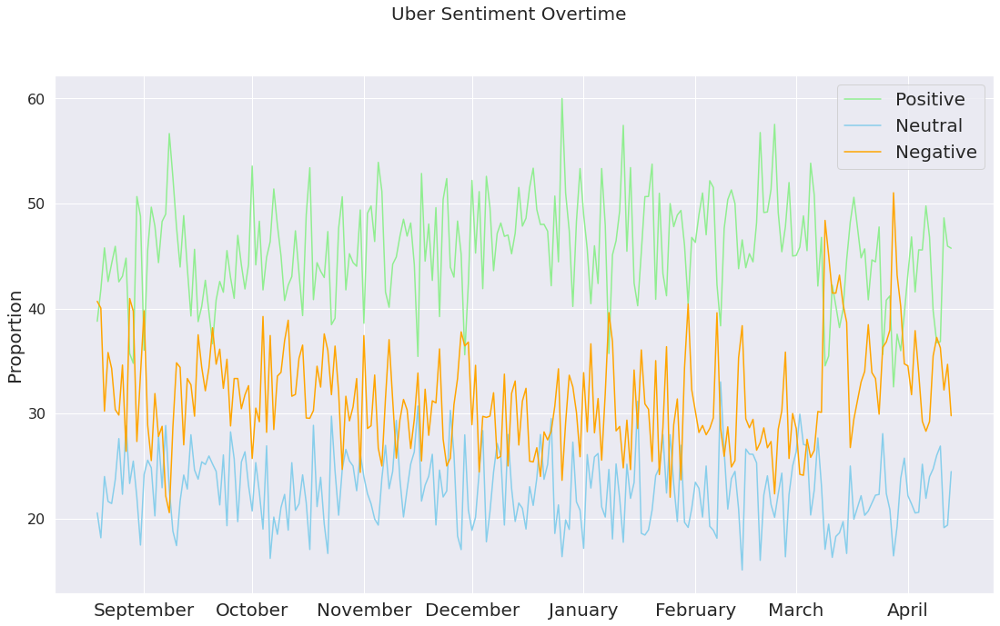

In [ ]:
uberTweets['date'] = [one.date() for one in uberTweets['date']]
uberTweets = uberTweets.sort_values(by=['date'])

plt.figure(figsize=[16,5])
barWidth = 0.5
labels = uberTweets.date.unique()

positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.plot(labels, positiveProps, color='lightgreen')
plt.plot(labels, neutralProps, color='skyblue')
plt.plot(labels, negativeProps, color='orange')

plt.yticks(fontsize=16)
plt.suptitle("Uber Sentiment Overtime", fontsize=20)
plt.ylabel("Proportion", fontsize=20)
plt.legend(sentiments, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(18.5, 10.5)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
uberTweets.sort_index(inplace=True)

####Word Cloud

#####Positive Sentiment Word Cloud

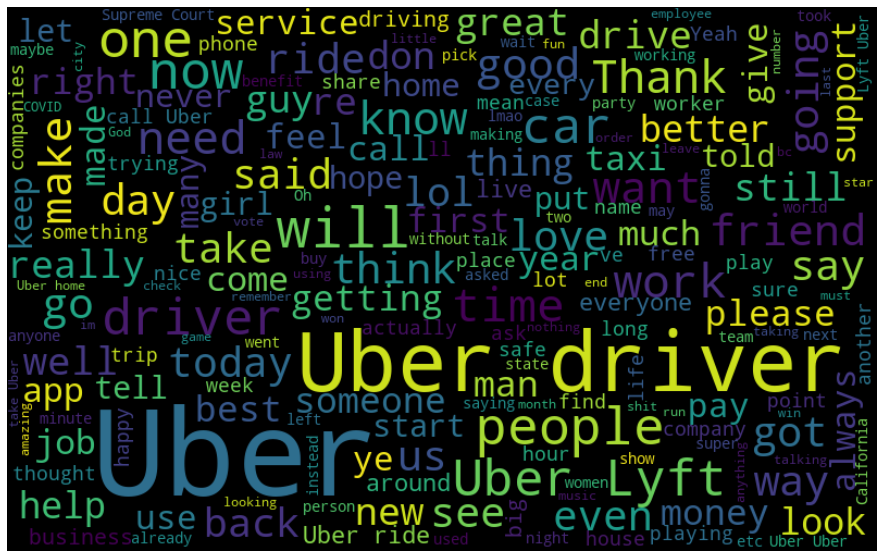

In [ ]:
# 2. Create bag of words for tweets of certain sentiment
all_words = ' '.join([text for text in uberTweets[uberTweets['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#####Negative Sentiment Word Cloud

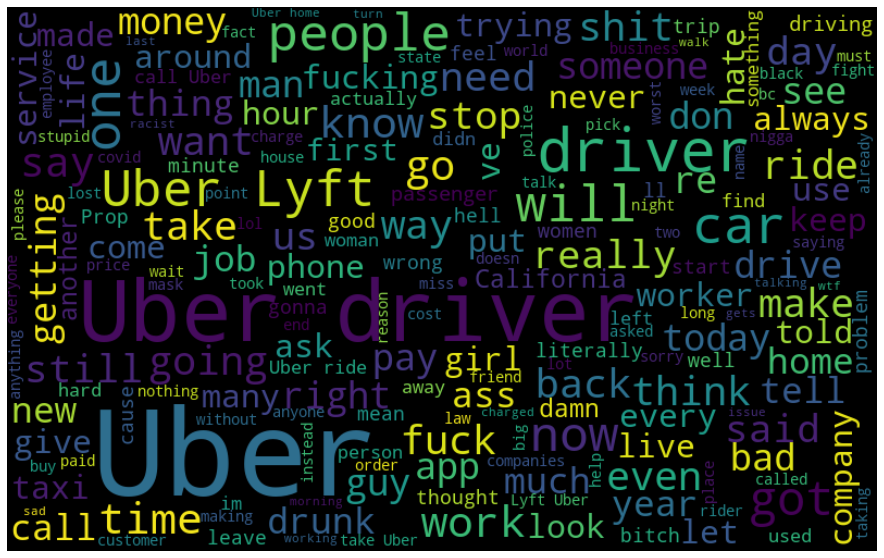

In [ ]:
# 2. Create bag of words for tweets of certain sentiment
all_words = ' '.join([text for text in uberTweets[uberTweets['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#####Noun chunk word cloud


In [ ]:
#  Load English language Model
nlp = spacy.load('en')

smallUberTweets = uberTweets.sample(10000, random_state=42)

smallUberTweets['NounChunks'] = smallUberTweets.stripped.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))

#  Check our work:
smallUberTweets[['content','NounChunks']].tail()

,content,NounChunks
52933,"@DudeLaw @JBENNETT5079 @JohnKincade @Uber I see you’re referring to Bobber Carpool. Yea, the back of the Camino is where it’s at. Lower fares, usually a fresh sixer rolling around, and always a bag of salted peanuts to enjoy during the ride.","[I, you, Bobber Carpool, the back, the Camino, it, Lower fares, a fresh sixer, always a bag, salted peanuts, the ride]"
34817,why the fuck is Uber so expensive,"[the fuck, Uber]"
146574,@Its_Me_Farhaan Uber picks up too😉,[]
159668,Damn this sucks. I remember seeing MadeinTYO &amp; 24Hrs there and losing my mind during Uber Everywhere. Good ass memory. https://t.co/NbkprBLtp2,"[I, my mind, Uber Everywhere, Good ass memory]"
129291,tes Uber for Twitter,"[tes Uber, Twitter]"


In [ ]:
# Define a function to Clean-up our Noun chunks by removing non-printable characters and stopwords, lemmatizing, stripping the text, and removing empty strings

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

#  Clean-up Function
'Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately'
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
smallUberTweets['Chunks'] = smallUberTweets.NounChunks.apply(lambda x: cleanNouns(x))

#  Check our work ---> What do you notice?
smallUberTweets[['content','NounChunks', 'Chunks']].tail()

,content,NounChunks,Chunks
52933,"@DudeLaw @JBENNETT5079 @JohnKincade @Uber I see you’re referring to Bobber Carpool. Yea, the back of the Camino is where it’s at. Lower fares, usually a fresh sixer rolling around, and always a bag of salted peanuts to enjoy during the ride.","[I, you, Bobber Carpool, the back, the Camino, it, Lower fares, a fresh sixer, always a bag, salted peanuts, the ride]","[bobber carpool, back, camino, lower fare, fresh sixer, always bag, salted peanut, ride]"
34817,why the fuck is Uber so expensive,"[the fuck, Uber]","[fuck, uber]"
146574,@Its_Me_Farhaan Uber picks up too😉,[],[]
159668,Damn this sucks. I remember seeing MadeinTYO &amp; 24Hrs there and losing my mind during Uber Everywhere. Good ass memory. https://t.co/NbkprBLtp2,"[I, my mind, Uber Everywhere, Good ass memory]","[mind, uber everywhere, good as memory]"
129291,tes Uber for Twitter,"[tes Uber, Twitter]","[te uber, twitter]"


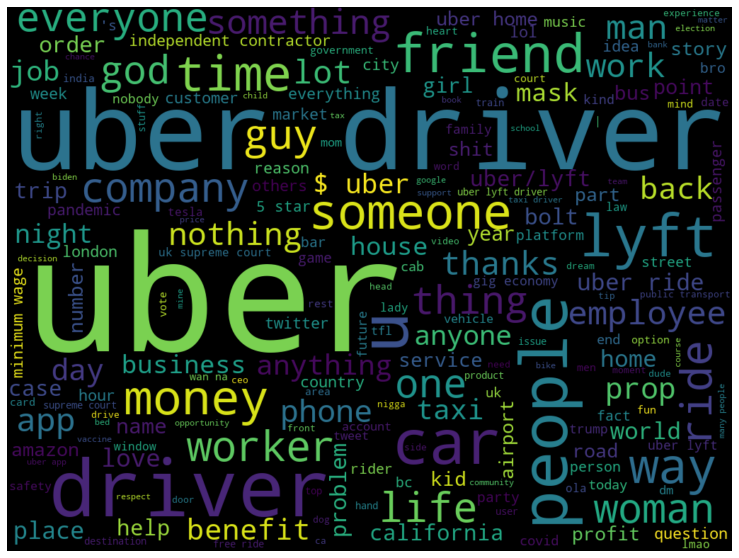

In [ ]:
# Set filters what we want to create a word cloud for
SelectSent='Positive'
nchunks = list(itertools.chain.from_iterable(smallUberTweets.Chunks[(smallUberTweets.Sentiment==SelectSent)]))

#  Convert it to dictionary with values and its occurences
word_could_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_could_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

###Sentiment Analysis of Lyft

In [ ]:
# Instantiate the sentiment analyzer
analyser = SentimentIntensityAnalyzer()

# Now get the compound sentiment score for each tweet
lyftTweets['C_Score'] = np.nan
for index, row in lyftTweets.iterrows(): 
    lyftTweets.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']
# Let's take a look!
pd.set_option('display.max_colwidth', None)
lyftTweets[['stripped','C_Score']][340:352]

,stripped,C_Score
1724,"The GOP wants corporations to stay out of politics but gladly accepts its campaign contributions. Note to GOP, Corporations are beholden to its shareholders and consumers and the people have spoken and don't like what the GOP is doing.",0.5244
1725,Let’s boycott Uber and Lyft til they lower the damn prices,-0.7351
1745,"Is anyone else having a hard time trading this market? ABNB DKNG FEYE LYFT UPST have been my last 5 trades, and they've all been rocky for me🥴",-0.1027
1748,tht nigga robbed a bank w. a butter knife then fled the scene in a lyft,0.0000
1752,one time I took a lyft to my friend’s apartment and she was outside waiting for me. she saw the driver get out when I got out was super confused thinking we were about to fight but in reality she was getting out to hug me give me homemade edibles lmao,0.8885
1759,"Example: in the before times, I was at the SF airport waiting for my Lyft to come pick me up. I was standing in a spot clearly marked for disabled folks only, so that I wouldn’t have to walk a long way to get to the car....",0.4019
1774,Told my Lyft driver I went to Baylor and he addressed me as “National Champ”. 5 STARS,0.0000
1775,For all those that are gonna point transportation as an issue; why don’t and provide such services as part of giving back to our nation? Think of all the free publicity they would get.,0.6908
1776,"“ $UBER and $LYFT have a driver shortage problem, and it’s costing them a lot of money. Uber says it will spend $250 million on a ‘stimulus’ for drivers” Quite ironic when both of them dream of robotaxis. I long argued UBER may run out of $ before this is technically feasible.",-0.7178
1785,Getting Drivers Back on the Road | $UBER also announcing a driver incentive program today. $DASH $LYFT,0.3612


####First impressions of sentiment

In [ ]:
print(f"Count positive tweets: {sum(lyftTweets['C_Score'] > 0.05)}")
print(f"Count netural tweets: {lyftTweets['C_Score'].between(-0.05, 0.05).sum()}")
print(f"Count negative tweets: {sum(lyftTweets['C_Score'] < -0.05)}")
print(f"Total number of tweets: {lyftTweets['C_Score'].count()}")
      
display(lyftTweets.C_Score.describe())

Count positive tweets: 9743
Count netural tweets: 4357
Count negative tweets: 7518
Total number of tweets: 21618


count    21618.000000
mean         0.061114
std          0.502687
min         -0.993900
25%         -0.318200
50%          0.000000
75%          0.473775
max          0.994400
Name: C_Score, dtype: float64

####Visualize sentiment

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Sentiment Distribution')]

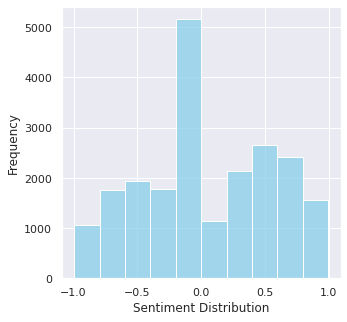

In [ ]:
# settings for seaborn plotting style
sns.set(color_codes=True)

# settings for seaborn plot sizes
sns.set(rc={'figure.figsize':(5,5)})

# Create Histogram
ax = sns.histplot(lyftTweets['C_Score'],
                  bins=10,
                  kde=False,
                  color='skyblue')
ax.set(xlabel='Sentiment Distribution', ylabel='Frequency')

####Categorize Sentiment

In [ ]:
# create new column
lyftTweets['Sentiment'] = np.nan

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in lyftTweets.iterrows(): 
    if lyftTweets.loc[index, 'C_Score'] > 0.05 : 
            lyftTweets.loc[index, 'Sentiment'] = "Positive"       
    elif lyftTweets.loc[index, 'C_Score'] < -0.05 :
            lyftTweets.loc[index, 'Sentiment'] = "Negative"   
    else : 
        lyftTweets.loc[index, 'Sentiment'] = "Neutral"

lyftTweets['Sentiment'] = lyftTweets['Sentiment'].astype("category")

In [ ]:
# See whether it worked 
lyftTweets[['stripped','C_Score', 'Sentiment']].tail(25)

,stripped,C_Score,Sentiment
113240,hi if ur a woman and you’ve planned an escape/been extra precautious or scared/gone the extra mile/been on high alert or anxious the whole ride in an uber or lyft (esp alone) pls interact w this tweet i’m trying to see something,-0.1280,Negative
113260,"The aggregate valuation of -backed IPOs in the U.S. is exploding, but the figure is top heavy: Uber and Lyft's public debuts accounted for more than half of the total of valuation of 2019 tech . Get more insights in our full report:",0.3071,Positive
113291,"Who pays them now? Uber and Lyft are dominating, mate.",-0.2960,Negative
113303,"I’m all for regulating companies like Lyft, Uber, DoorDash, etc. But there was no need to cast the net so wide that it destroyed the livelihoods of the creative class. AB5 is a badly flawed piece of legislation. It should be repealed and replaced with something more targeted.",-0.8573,Negative
113316,it smells like vag sweat in this Lyft rn,0.3612,Positive
113325,my lyft user rating is 4.9 im not tryna brag tho,0.0000,Neutral
113332,Slow lyft drivers are literally the worst.,-0.6249,Negative
113338,My lyft driver looks like a last of us fan art of bam margera n it’s killing me,-0.1531,Negative
113349,Taxis: We've always done it this way! Uber/Lyft: Hold my phone,0.0000,Neutral
113363,"If an established company like Lyft/Motivate, with logistics and staff already in place has only 50 e-bikes out on street after 4 days, think of the enormous challenge of putting 10K scooters out in about a week having to create infrastructure literally overnight.",0.6361,Positive


####Visualize Categories

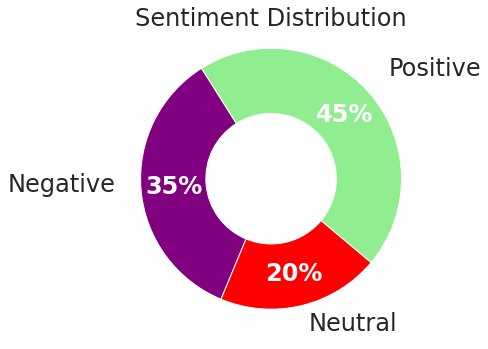

In [ ]:
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = lyftTweets.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

####Sentiment Categories overtime

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


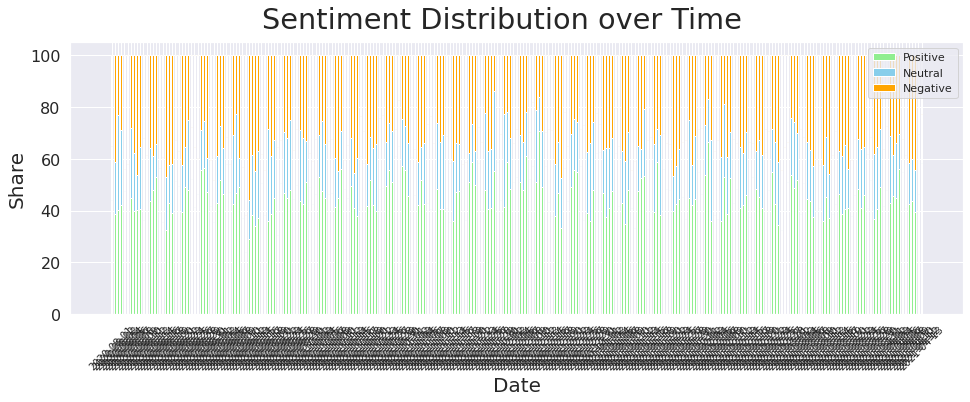

In [ ]:
lyftTweets['day'] = [one.date() for one in lyftTweets['date']]
lyftTweets = lyftTweets.sort_values(by=['day'])

sentiments = ["Positive", "Neutral", "Negative"]
positiveProps = (lyftTweets[lyftTweets.Sentiment == 'Positive'].groupby(['day']).count()[['Sentiment']]/ lyftTweets.groupby(['day']).count()[['Sentiment']])*100
neutralProps = (lyftTweets[lyftTweets.Sentiment == 'Neutral'].groupby(['day']).count()[['Sentiment']]/ lyftTweets.groupby(['day']).count()[['Sentiment']])*100
negativeProps = (lyftTweets[lyftTweets.Sentiment == 'Negative'].groupby(['day']).count()[['Sentiment']]/ lyftTweets.groupby(['day']).count()[['Sentiment']])*100
 
positiveProps = positiveProps['Sentiment'].tolist()
neutralProps = neutralProps['Sentiment'].tolist()
negativeProps = negativeProps['Sentiment'].tolist()
plt.figure(figsize=[16, 5])
barWidth = 0.5
labels = lyftTweets.day.unique()
r = np.arange(len(labels))
positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.bar(r,positiveProps, color='lightgreen', edgecolor='white', width=barWidth)
plt.bar(r, neutralProps, bottom=positiveProps, color='skyblue', edgecolor='white', width=barWidth)
plt.bar(r, negativeProps, bottom=[i+j for i,j in zip(positiveProps, neutralProps)], color='orange', edgecolor='white', width=barWidth)
 
plt.xticks( r, labels, rotation = 45, fontsize=10)
plt.yticks(fontsize=16)
plt.suptitle('Sentiment Distribution over Time')
plt.xlabel("Date", fontsize=20)
plt.ylabel("Share", fontsize=20)
plt.legend(sentiments)
plt.show()
# Sort by Index again
lyftTweets.sort_index(inplace=True)

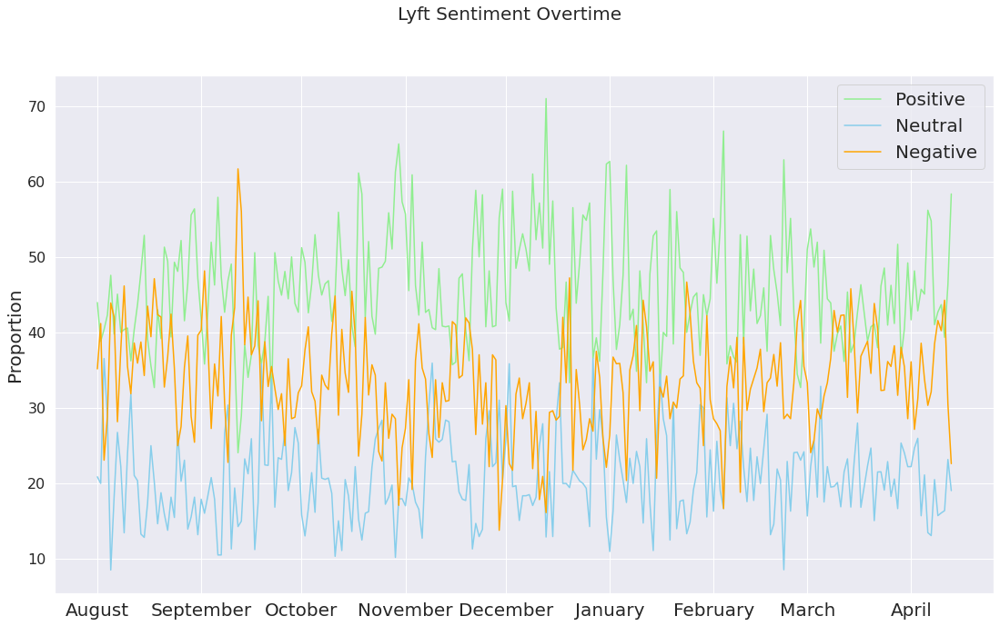

In [ ]:
lyftTweets['date'] = [one.date() for one in lyftTweets['date']]
lyftTweets = lyftTweets.sort_values(by=['date'])

plt.figure(figsize=[16,5])
barWidth = 0.5
labels = lyftTweets.date.unique()

positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.plot(labels, positiveProps, color='lightgreen')
plt.plot(labels, neutralProps, color='skyblue')
plt.plot(labels, negativeProps, color='orange')

plt.yticks(fontsize=16)
plt.suptitle("Lyft Sentiment Overtime", fontsize=20)
plt.ylabel("Proportion", fontsize=20)
plt.legend(sentiments, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(18.5, 10.5)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
lyftTweets.sort_index(inplace=True)

####Word Cloud

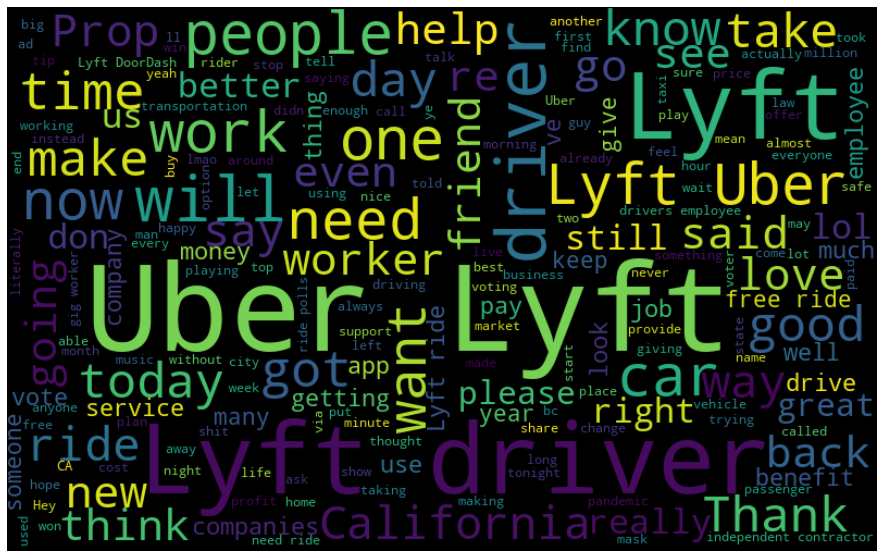

In [ ]:
# Create bag of words for tweets of certain sentiment - can change to negative to see negative sentiment
all_words = ' '.join([text for text in lyftTweets[lyftTweets['Sentiment'] == 'Positive']['stripped']])

#  Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_words)

#  Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#####Noun chunk word cloud

In [ ]:
# Load English language Model
nlp = spacy.load('en')

smallLyftTweets = lyftTweets.sample(10000, random_state=42)

smallLyftTweets['NounChunks'] = smallLyftTweets.stripped.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))

# Check our work:
smallLyftTweets[['content','NounChunks']].tail()

,content,NounChunks
1578,"2 significant headlines from @lyft President @JohnZimmer:\n1) Lyft explicitly opposes GA, TX, AZ &amp; all other restrictive voting laws / bills. \n2) Lyft **supports** increasing the U.S. corporate tax rate to 28% to pay for Biden’s $2.2T infrastructure plan. https://t.co/tpWk1AbLyW","[2 significant headlines, President, Lyft, GA, TX, AZ, all other restrictive voting laws / bills, Lyft, the U.S. corporate tax rate, 28%, Biden, $2.2T infrastructure plan]"
50110,*alt coin* A fren shilled me $BUND a few days ago and I already 2 Xed my initial investment. Im glad I listened to him. locked liquidity. low supply. finished audit. interesting and innovative concept. prepare for lyft off frens! 🚀🚀https://t.co/W52qG9SE9Q\nDYOR,"[*alt coin, A fren, me, $BUND, I, my initial investment, I, I, him, locked liquidity, low supply, finished audit, interesting and innovative concept, lyft off frens, 🚀🚀 DYOR]"
100654,"@TeamBandL Uber and Lyft situation is reversible if politicians will swallow their pride, admit their mistakes, and find a better solution","[Uber and Lyft situation, politicians, their pride, their mistakes, a better solution]"
53026,"@TimNissen1 @TurboKitty We do try, this attempt to regulate the gig economy firms such as Uber &amp; Lyft and get benefits for drivers failed. \n\nhttps://t.co/Vrfxmd4itX","[We, this attempt, the gig economy firms, Uber Lyft, benefits, drivers]"
31218,Lyft lost $2.6 billion in 2019. Total bullshit business model designed to make its early investors hundreds of millions of dollars while bleeding out the people doing all the work. https://t.co/UzNcxzpg57,"[Lyft, Total bullshit business model, its early investors, hundreds of millions, dollars, the people, all the work]"


In [ ]:
# Define a function to Clean-up our Noun chunks by removing non-printable characters and stopwords, lemmatizing, stripping the text, and removing empty strings
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

# Clean-up Function
'Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately'
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
smallLyftTweets['Chunks'] = smallLyftTweets.NounChunks.apply(lambda x: cleanNouns(x))

# Check our work
smallLyftTweets[['content','NounChunks', 'Chunks']].tail()

,content,NounChunks,Chunks
1578,"2 significant headlines from @lyft President @JohnZimmer:\n1) Lyft explicitly opposes GA, TX, AZ &amp; all other restrictive voting laws / bills. \n2) Lyft **supports** increasing the U.S. corporate tax rate to 28% to pay for Biden’s $2.2T infrastructure plan. https://t.co/tpWk1AbLyW","[2 significant headlines, President, Lyft, GA, TX, AZ, all other restrictive voting laws / bills, Lyft, the U.S. corporate tax rate, 28%, Biden, $2.2T infrastructure plan]","[2 significant headline, president, lyft, ga, tx, az, restrictive voting law / bill, lyft, u.s. corporate tax rate, 28 %, biden, $ 2.2t infrastructure plan]"
50110,*alt coin* A fren shilled me $BUND a few days ago and I already 2 Xed my initial investment. Im glad I listened to him. locked liquidity. low supply. finished audit. interesting and innovative concept. prepare for lyft off frens! 🚀🚀https://t.co/W52qG9SE9Q\nDYOR,"[*alt coin, A fren, me, $BUND, I, my initial investment, I, I, him, locked liquidity, low supply, finished audit, interesting and innovative concept, lyft off frens, 🚀🚀 DYOR]","[*alt coin, fren, $ bund, initial investment, locked liquidity, low supply, finished audit, interesting innovative concept, lyft frens, dyor]"
100654,"@TeamBandL Uber and Lyft situation is reversible if politicians will swallow their pride, admit their mistakes, and find a better solution","[Uber and Lyft situation, politicians, their pride, their mistakes, a better solution]","[uber lyft situation, politician, pride, mistake, better solution]"
53026,"@TimNissen1 @TurboKitty We do try, this attempt to regulate the gig economy firms such as Uber &amp; Lyft and get benefits for drivers failed. \n\nhttps://t.co/Vrfxmd4itX","[We, this attempt, the gig economy firms, Uber Lyft, benefits, drivers]","[attempt, gig economy firm, uber lyft, benefit, driver]"
31218,Lyft lost $2.6 billion in 2019. Total bullshit business model designed to make its early investors hundreds of millions of dollars while bleeding out the people doing all the work. https://t.co/UzNcxzpg57,"[Lyft, Total bullshit business model, its early investors, hundreds of millions, dollars, the people, all the work]","[lyft, total bullshit business model, early investor, hundred million, dollar, people, work]"


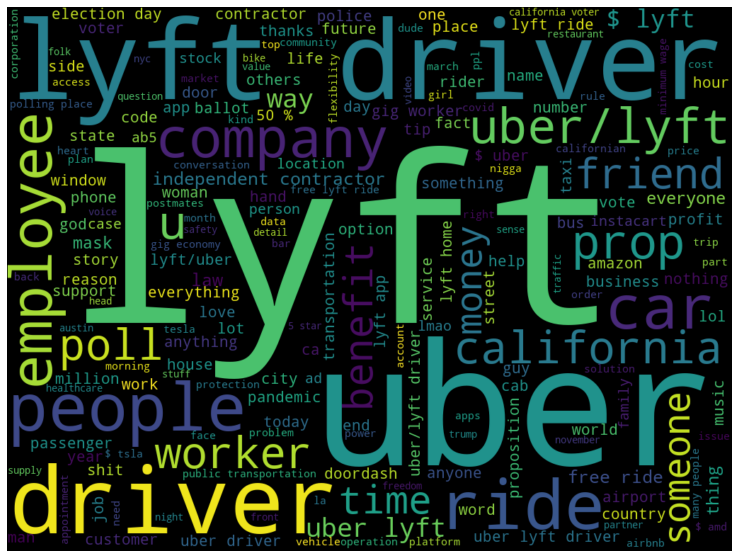

In [ ]:
# Set filters what we want to create a word cloud for
SelectSent='Positive'
nchunks = list(itertools.chain.from_iterable(smallLyftTweets.Chunks[(smallLyftTweets.Sentiment==SelectSent)]))

# Convert it to dictionary with values and its occurences
word_could_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_could_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

### Safety Analysis

####Topic Tagging

In [ ]:
# Let's try to identify tweets that are about safety

np.where([re.search('Uber', t.get('username'), re.IGNORECASE) for t in uberTweets.user], 1, 0)


uberTweets['Safety'] = np.where(uberTweets.stripped.str.contains('(?:^|\W)(safety|unsafe|dangerous|safeness|pandemic|virus|safe|covid|coronavirus|covid-19|clean|sanitize|mask|Door-to-Door|face|cover|mask|verification|clorox|ridecheck|shared|rape|rapes|front seat)(?:$|\W)',                                                                                                      # beer|booze|brew|bottle|pint|hops|drink|beach
    flags = re.IGNORECASE), 1, 0)

lyftTweets['Safety'] = np.where(lyftTweets.stripped.str.contains('(?:^|\W)(safety|unsafe|dangerous|safeness|pandemic|virus|safe|covid|coronavirus|covid-19|clean|sanitize|mask|Door-to-Door|face|cover|mask|verification|clorox|ridecheck|shared|rape|rapes|front seat)(?:$|\W)',                                                                                                      # beer|booze|brew|bottle|pint|hops|drink|beach
    flags = re.IGNORECASE), 1, 0)

posUber = uberTweets[uberTweets['Sentiment'] == 'Positive']
posLyft = lyftTweets[lyftTweets['Sentiment'] == 'Positive']
negUber = uberTweets[uberTweets['Sentiment'] == 'Negative']
negLyft = lyftTweets[lyftTweets['Sentiment'] == 'Negative']

print(f"Total Uber Tweets about Safety: {uberTweets['Safety'].sum()}")
print(f"Total Lyft Tweets about Safety: {lyftTweets['Safety'].sum()}")
print(f"Positive Uber Tweets about Safety: {posUber['Safety'].sum()}")
print(f"Positive Lyft Tweets about Safety: {posLyft['Safety'].sum()}")
print(f"Negative Uber Tweets about Safety: {negUber['Safety'].sum()}")
print(f"Negative Lyft Tweets about Safety: {negLyft['Safety'].sum()}")
print(f"Proportion of pos safety tweets to total safety tweets - Uber: {(posUber['Safety'].sum()) / (uberTweets['Safety'].sum())} ")
print(f"Proportion of pos safety tweets to total safety tweets - Lyft: {(posLyft['Safety'].sum()) / (lyftTweets['Safety'].sum())} ")
print(f"Proportion of neg safety tweets to total safety tweets - Uber: {(negUber['Safety'].sum()) / (uberTweets['Safety'].sum())} ")
print(f"Proportion of neg safety tweets to total safety tweets - Lyft: {(negLyft['Safety'].sum()) / (lyftTweets['Safety'].sum())} ")

/usr/local/lib/python3.7/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


Total Uber Tweets about Safety: 2321
Total Lyft Tweets about Safety: 1507
Positive Uber Tweets about Safety: 1203
Positive Lyft Tweets about Safety: 780
Negative Uber Tweets about Safety: 845
Negative Lyft Tweets about Safety: 571
Proportion of pos safety tweets to total safety tweets - Uber: 0.5183110728134425 
Proportion of pos safety tweets to total safety tweets - Lyft: 0.517584605175846 
Proportion of neg safety tweets to total safety tweets - Uber: 0.36406721240844464 
Proportion of neg safety tweets to total safety tweets - Lyft: 0.3788984737889847 


In [ ]:
#Let's look at some of the tweets that discuss safety

#you can change variables to neg or lyft here

posUber[posUber['Safety'] == 1]['stripped'].sample(20)

172205                                                                            There’s so much to digest here in my 💧 In car optimizations for revenue in hyper-saturated markets. 🥊 It’s a competitors ad. ⚔️That competitor did a JV in a different market. 🤲 Gigantic. 😷 COVID seperator.
112147                                                                                             things are slowly getting better ! with the money i was able to get, we were able to cover part of the damage costs to the car as well as uber fare for my mom for the next week or so ! 2/3
144499                                                                                                                 i forgot my mask on my way to running for my uber so i had to run back upstairs and now i’m out of breath in this mask in this car and i feel like i’m gonna Pass Out ♥️
223133                                                                                                                                  

I feel like this does not provide good insights. Maybe we should look into major topics in uber and then filter safety from there.

###Identifying Major Topics in Uber Tweets

In [ ]:
# Load USE pre-trained model
module_url = "https://tfhub.dev/google/universal-sentence-encoder-large/5"
embed = hub.load(module_url) #download and load the model
print("Done!")

Done!


####Embed tweets into feature vectors

For the interactive map portion we have to have a smaller data set so we will use smallUberTweets which has 10,000 tweets

In [ ]:
%%time

# Create a unique input ID (to the USE model) for each tweet - we will simply use the index of the smallUberTweets DataFrame
input_ids = smallUberTweets.index

# We will send the tweets for embeding to USE in batches (commonly done to ensure that we don't run out of RAM during the embeddig process)
batch_size = 1000
n_of_iterations = (input_ids.shape[0] + batch_size - 1) // batch_size
display(f"Number of Batches: {n_of_iterations}")

# Create a Dataframe that will hold the feature vectors
FeatureVectors = pd.DataFrame(columns = ['TweetVectors'])#, index = test.index)

# Send tweets batch by batch to USE
for i in range(n_of_iterations): 
    use_vecs = pd.DataFrame(index=smallUberTweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']].index)
    embeddings = embed(smallUberTweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']]['stripped'])
    use_vecs['TweetVectors'] = pd.Series(np.array(embeddings).tolist(), index=use_vecs.index) 
    FeatureVectors = pd.concat([FeatureVectors,use_vecs])

# Add Feature Vectors to tweets DataFrane
smallUberTweets = pd.concat([smallUberTweets, FeatureVectors], axis=1)

'Number of Batches: 10'

CPU times: user 6min 11s, sys: 5.41 s, total: 6min 16s
Wall time: 3min 26s


In [ ]:
# Let's take a look!
smallUberTweets.head(5)

,id,content,date,user,retweetCount,likeCount,text,stripped,Company,Film,Adverb,phraseAdverb,eats,Uberthemselves,C_Score,Sentiment,day,NounChunks,Chunks,TweetVectors
192327,1312424966797832195,"@samdclulow @piersmorgan @UberEats Hang on, if we all decided to stop being ""lazy"" and go collect it ourselves... then the uber driver wouldn't have a job?...",2020-10-03,"{'username': 'danboy81', 'displayname': 'Dan', 'id': 41082401, 'description': 'general chit chat and rants about things that grind my nuts FYI most things grind my nuts!', 'rawDescription': 'general chit chat and rants about things that grind my nuts FYI most things grind my nuts!', 'descriptionUrls': [], 'verified': False, 'created': '2009-05-19T08:56:37+00:00', 'followersCount': 742, 'friendsCount': 708, 'statusesCount': 27009, 'favouritesCount': 874, 'listedCount': 9, 'mediaCount': 694, 'location': 'Manchester', 'protected': False, 'linkUrl': None, 'linkTcourl': None, 'profileImageUrl': 'https://pbs.twimg.com/profile_images/1304458692163768325/CtMvo6kR_normal.jpg', 'profileBannerUrl': 'https://pbs.twimg.com/profile_banners/41082401/1416918057', 'url': 'https://twitter.com/danboy81'}",0,4,"Hang on, if we all decided to stop being ""lazy"" and go collect it ourselves... then the uber driver wouldn't have a job?...","Hang on, if we all decided to stop being ""lazy"" and go collect it ourselves... then the uber driver wouldn't have a job?...",1,0,0,0,0,0,-0.5719,Negative,2020-10-03,"[we, it, the uber driver, a job]","[uber driver, job]","[0.03234284743666649, -0.013458136469125748, -0.004475618712604046, 0.061834901571273804, 0.09056530892848969, 0.006415911950170994, -0.024776151403784752, 0.03196699172258377, 0.03321490064263344, -0.010103173553943634, -0.016678093001246452, 0.03143996745347977, -0.08113810420036316, 0.021874908357858658, -0.002084113657474518, 0.018025323748588562, -0.025976523756980896, -0.00486173527315259, -0.00811014510691166, -0.015756206586956978, -0.05567818135023117, 0.07826434075832367, -0.010787921957671642, 0.07786055654287338, -0.0056462837383151054, -0.04361744970083237, -0.04605023190379143, 0.02395729534327984, 0.04706455394625664, 0.020069202408194542, -0.015790347009897232, -0.028842834755778313, 0.10507698357105255, 0.020430581644177437, -0.08396565914154053, -0.009770379401743412, 0.010702012106776237, 0.023470303043723106, -0.05610838532447815, 0.05339803919196129, 0.048972900956869125, 0.03858007490634918, 0.021695420145988464, -0.02813388966023922, -0.008337117731571198, -0.03817915543913841, 0.027818478643894196, -0.0010053908918052912, -0.010578754357993603, 0.001057629706338048, 0.010012722574174404, -0.007547349203377962, 0.09578001499176025, 0.01053638756275177, 0.06248155236244202, 0.03185288608074188, -0.048685137182474136, 0.0013332075905054808, 0.00443998770788312, -0.04836102947592735, 0.03626914322376251, -0.020823679864406586, -0.05006473511457443, 0.025318147614598274, -0.012588366866111755, 0.06340163946151733, 0.12266180664300919, 0.024853235110640526, 0.05861320346593857, 0.09458381682634354, -0.01121994387358427, 0.04448122903704643, -0.027273748070001602, 0.042461689561605453, -0.01371760107576847, 0.04173282906413078, -0.00035632358049042523, -0.07589537650346756, -0.01820847950875759, 0.026148419827222824, 0.028807541355490685, -0.020550962537527084, -0.03214919939637184, 0.03263138607144356, -0.008589094504714012, 0.021148649975657463, -0.03478723764419556, -0.04679743945598602, 0.04196088761091232, -0.0014990577474236488, -0.0016460851766169071, -0.032190896570682526, -0.04211163520812988, 0.014377929270267487, -0.03034568950533867, -0.01737808622419834, 0.06464357674121857, 0.06265968084335327, -0.02780914679169655, 0.025065388530492783, ...]"
204359,1307874072626298880,Uber Glass Shaded Helms. (Having fun with this shader and have no clue how it works xD) https://t.co/rSFa4Cu2HI https://t.co/pdoh6BKQpz,2020-09-21,"{'username': 'agriclaudia', 'displayname': 'Claudia', 'id': 270457169, 'description': 'I l

####Outlier Removal

In [ ]:
# Get vectors from dataframe
tweet_embeddings = smallUberTweets.TweetVectors.to_list()

# Set share of outliers to detect and remove
outliers_fraction = 0.1

# Instantiate, fit and predict (note that by removing the hyperparameter "contamination" the model will try to detrmine the number of outliers itself)
isf = IsolationForest(contamination=outliers_fraction,random_state=42, n_jobs=-1)
y_pred = isf.fit(tweet_embeddings).predict(tweet_embeddings)

# How many outliers identified?
print(f"Number of detected outliers is {(y_pred == -1).sum()}")

Number of detected outliers is 1000


In [ ]:
# Create list of indices of outliers
result = np.where(y_pred == -1)
remove=result[0].tolist()

# Delete outliers
print(f"Number of embedded tweets in array before outlier removal is {len(tweet_embeddings)}")  
for i in sorted(remove, reverse=True):
    del tweet_embeddings[i]
print(f"Number of embedded tweets in array after outlier removal is {len(tweet_embeddings)}")    

print(f"Number of records in tweets dataframe before outlier removal is {smallUberTweets.shape}")    
smallUberTweets.drop(smallUberTweets.index[remove], inplace=True)
print(f"Number of records in tweets dataframe before outlier removal is {smallUberTweets.shape}")    

Number of embedded tweets in array before outlier removal is 10000
Number of embedded tweets in array after outlier removal is 9000
Number of records in tweets dataframe before outlier removal is (10000, 20)
Number of records in tweets dataframe before outlier removal is (9000, 20)


#### Find number of Topics

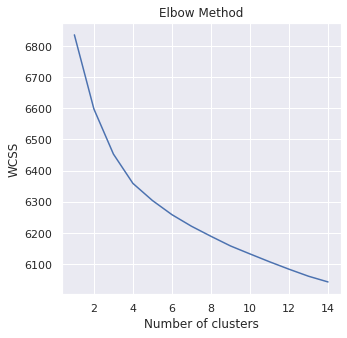

CPU times: user 3min 9s, sys: 1min 10s, total: 4min 20s
Wall time: 2min 53s


In [ ]:
%%time

# Create an array of tweet vectors to pass as feature vectors to k-Means clustering
wcss = []

# Cluster for various k
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=1000, n_init=10, random_state=0)
    kmeans.fit(smallUberTweets.TweetVectors.to_list())
    wcss.append(kmeans.inertia_)

# Plot Elbow Chart
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### Inspect Topic Size Distribution

CPU times: user 16.5 s, sys: 1.6 s, total: 18.1 s
Wall time: 15.6 s


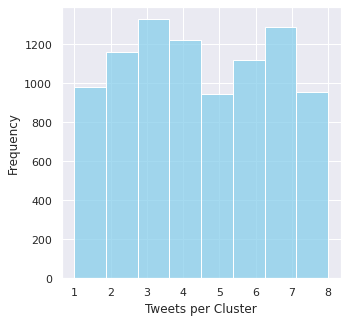

In [ ]:
%%time
# 1. Set k
k=8

# Cluster with K-Mean
kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=1000, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(smallUberTweets.TweetVectors.to_list())+1

# Add Topic to Results
smallUberTweets['Topic'] = pred_y

# Settings for seaborn plotting style
sns.set(color_codes=True)

# Settings for seaborn plot sizes
sns.set(rc={'figure.figsize':(5,5)})

# Create Histogram
ax = sns.histplot(pred_y,
                  bins=k,
                  kde=False,
                  color='skyblue')
ax.set(xlabel='Tweets per Cluster', ylabel='Frequency')

#### Explore topics

In [ ]:
# Initialize new Column
smallUberTweets['Relevance']=np.nan

# Loop through all ientified Topics to calculate centrality of each tweet in its corresponding topic
for t in range(1,smallUberTweets.Topic.max()+1):

    #  Create topic DataFrame with tweets of topic t
    topic = smallUberTweets[['Topic','TweetVectors']][smallUberTweets.Topic==t]

    #  Create a cosine similarity matrix (WARNING: If you have too many tweets then this matrix will get way to large for your system to handle!)
    cos_sim = sklearn.metrics.pairwise.cosine_similarity(topic.TweetVectors.to_list(),topic.TweetVectors.to_list())
    cos_sim[np.isnan(cos_sim)] = 1

    #  Weighed Degree Centrality is the sum of a node's weighted edges = sum of cosine similarities to other vectors minus self-similarity
    topic['Relevance']=pd.Series((np.sum(cos_sim,axis=1)-1).tolist()).values.round(2)

    #  #Re-Scale centraluty from 0 to 1
    topic['Relevance']=topic['Relevance']/topic['Relevance'].max()*100 

    #  Drop Columns we don't need
    topic.drop(topic.columns[[0, 1]], axis = 1, inplace = True)

    #  Update tweets dataframe with centrality for tweets in topic t
    smallUberTweets.update(topic)

***Let's take a look at the Top 25 most central tweets in several topics***

In [ ]:
# Get most central N tweets in Topic t - can change t to look at different topics
t=1  # topic id
N=25 # number of most central tweets

# Create object for most central tweets 
s = smallUberTweets[smallUberTweets.Topic==t].nlargest(N, columns=['Relevance']).stripped

# Print most central tweets line by line
for index in s.index:
    print(s[index])

The main person who attacked the uber driver ain't even black yet this idiot uses this opportunity to go after African Americans. A tale as old as time 🙄
Can we help this Uber driver retire so he never has to deal with the street thots again? He deserves it. 🙏
She’s lucky that Uber driver was passive, or she wouldn’t even make it to jail....
Woman Who Assaulted Uber Driver Sued Over 2019 Car Crash
😂😂😂 The trouble with Uber is that when you leave your phone behind, they don't return it in time to prevent you from assaulting Black teenagers after falsely accusing them of stealing your phone.
The San Francisco District Attorney’s Office announced multiple charges against Arna Kimaiai, one of the women suspected in an attack of an Uber driver that was caught on camera earlier this month.
Y’all really let her get 6,000 new followers for assaulting and coughing on an Uber driver? Disgusting.
Someone made an account of the trashy bîtch who assaulted the Uber driver and I thought the GoFundMe 

####Interactive Map

In [ ]:
%%time

# Instantiate and Fit t-SNE
X_tsne = TSNE(n_components=2, verbose=1, perplexity=25, n_iter=1000, learning_rate=25, random_state=21).fit_transform(smallUberTweets.TweetVectors.to_list())

# Save X,Y Coordinates in tweets DataFrame
smallUberTweets['tSNE_X']=pd.Series((X_tsne[:, 0]).tolist()).values
smallUberTweets['tSNE_Y']=pd.Series((X_tsne[:, 1]).tolist()).values

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 9000 samples in 0.917s...
[t-SNE] Computed neighbors for 9000 samples in 117.051s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9000
[t-SNE] Computed conditional probabilities for sample 2000 / 9000
[t-SNE] Computed conditional probabilities for sample 3000 / 9000
[t-SNE] Computed conditional probabilities for sample 4000 / 9000
[t-SNE] Computed conditional probabilities for sample 5000 / 9000
[t-SNE] Computed conditional probabilities for sample 6000 / 9000
[t-SNE] Computed conditional probabilities for sample 7000 / 9000
[t-SNE] Computed conditional probabilities for sample 8000 / 9000
[t-SNE] Computed conditional probabilities for sample 9000 / 9000
[t-SNE] Mean sigma: 0.226558
[t-SNE] KL divergence after 50 iterations with early exaggeration: 94.788170
[t-SNE] KL divergence after 1000 iterations: 3.176329
CPU times: user 4min 53s, sys: 1.31 s, total: 4min 54s
Wall time: 3min 30s


In [ ]:
# Create a new DataFrame that holds all the information we need for our map

tweets = smallUberTweets.sample(5000, random_state=42)

source = pd.DataFrame(
    {'x': tweets['tSNE_X'],
     'y': tweets['tSNE_Y'],
     'txt': tweets["text"],
     'Topic' : tweets['Topic'],
     'Relevance' : tweets['Relevance']
    })


# Define Bubbles on Map
bubbles = alt.Chart(source).mark_circle().encode(
    x=alt.X('x:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.x)-10, max(source.x)+20])),
    y=alt.Y('y:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.y)-10, max(source.y)+10])),
    #size='Relevance:Q',
    color = 'Topic:N',
    tooltip=[alt.Tooltip('txt', title='Tweet'),                            # We can include a lot of information in the tooltips (mouseover pop-up)
             alt.Tooltip('Topic', title='Topic'),
             alt.Tooltip('Relevance', title='Relevance')
            ]
)

# Visualizes tweets in an interactive Map
bubbles.encode(text='txt').interactive().properties(height=700,width=700,title="Uber Tweets") 

alt.Chart(...)

Identify topics:



1.   Dark Blue - Broadly about safety with a focus on driver safety - a majority of the tweets are about assaults against uber drivers
2.   Orange - About taking an uber and drinking and driving
3.   Red - Uber and money/economy, some of the tweets are pretty random in this cluster - I think it possibly is a cluster of tweets that have the $ sign appear multiple times
4.   Light Blue - short tweets about uber
5.   Green - seems to be about customers tweeting about their uber driver and things their uber driver did - mainly positive
6.   Yellow - act of taking an uber or spending money on uber and broadly about customer experiences while in the uber
7.   Purple - these seem to be news or articles about how uber the company is doing in the market or economically. Also centered around money and how much uber driver's make
8.   Pink - these seem pretty random but maybe also centered around uber drivers and the act of taking an uber. Green, Yellow, and Pink are pretty closely related but pink seem to be longer tweets.




###Uber Safety Sub Topics

#### Create Safety Tweets DF

In [ ]:
safetyTweets = smallUberTweets[smallUberTweets['Topic']==1]
safetyTweets = safetyTweets.filter(['id', 'content', 'date', 'text', 'stripped', 'C_Score', 'Sentiment'], axis=1)
safetyTweets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 983 entries, 32684 to 154279
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   id         983 non-null    int64   
 1   content    983 non-null    object  
 2   date       983 non-null    object  
 3   text       983 non-null    object  
 4   stripped   983 non-null    object  
 5   C_Score    983 non-null    float64 
 6   Sentiment  983 non-null    category
dtypes: category(1), float64(1), int64(1), object(4)
memory usage: 54.8+ KB


####Embed safety tweets into feature vectors

In [ ]:
%%time

# Create a unique input ID (to the USE model) for each tweet - we will simply use the index of the tweet DataFrame
input_ids = safetyTweets.index

# We will send the tweets for embeding to USE in batches (commonly done to ensure that we don't run out of RAM during the embeddig process)
batch_size = 1000
n_of_iterations = (input_ids.shape[0] + batch_size - 1) // batch_size
display(f"Number of Batches: {n_of_iterations}")

# Create a Dataframe that will hold the feature vectors
FeatureVectors = pd.DataFrame(columns = ['TweetVectors'])#, index = test.index)

# Send tweets batch by batch to USE
for i in range(n_of_iterations): 
    use_vecs = pd.DataFrame(index=safetyTweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']].index)
    embeddings = embed(safetyTweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']]['stripped'])
    use_vecs['TweetVectors'] = pd.Series(np.array(embeddings).tolist(), index=use_vecs.index) 
    FeatureVectors = pd.concat([FeatureVectors,use_vecs])

# Add Feature Vectors to tweets DataFrane
safetyTweets = pd.concat([safetyTweets, FeatureVectors], axis=1)

'Number of Batches: 1'

CPU times: user 40.3 s, sys: 387 ms, total: 40.7 s
Wall time: 22 s


####Outlier Removal

In [ ]:
#  Get vectors from dataframe
tweet_embeddings = safetyTweets.TweetVectors.to_list()

# Set share of outliers to detect and remove
outliers_fraction = 0.1

# Instantiate, fit and predict (note that by removing the hyperparameter "contamination" the model will try to detrmine the number of outliers itself)
isf = IsolationForest(contamination=outliers_fraction,random_state=42, n_jobs=-1)
y_pred = isf.fit(tweet_embeddings).predict(tweet_embeddings)

# How many outliers identified?
print(f"Number of detected outliers is {(y_pred == -1).sum()}")

Number of detected outliers is 99


In [ ]:
# Create list of indices of outliers
result = np.where(y_pred == -1)
remove=result[0].tolist()

# Delete outliers
print(f"Number of embedded tweets in array before outlier removal is {len(tweet_embeddings)}")  
for i in sorted(remove, reverse=True):
    del tweet_embeddings[i]
print(f"Number of embedded tweets in array after outlier removal is {len(tweet_embeddings)}")    

print(f"Number of records in tweets dataframe before outlier removal is {safetyTweets.shape}")    
safetyTweets.drop(safetyTweets.index[remove], inplace=True)
print(f"Number of records in tweets dataframe before outlier removal is {safetyTweets.shape}") 

Number of embedded tweets in array before outlier removal is 983
Number of embedded tweets in array after outlier removal is 884
Number of records in tweets dataframe before outlier removal is (983, 8)
Number of records in tweets dataframe before outlier removal is (884, 8)


####Find number of sub topics in Safety Tweets

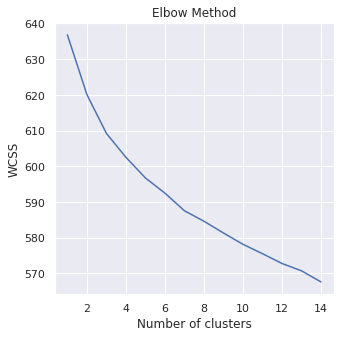

CPU times: user 16 s, sys: 11.1 s, total: 27 s
Wall time: 14.3 s


In [ ]:
%%time

# 2. Create an array of tweet vectors to pass as feature vectors to k-Means clustering
wcss = []

# 3. Cluster for various k
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=1000, n_init=10, random_state=0)
    kmeans.fit(safetyTweets.TweetVectors.to_list())
    wcss.append(kmeans.inertia_)

# 4. Plot Elbow Chart
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

####Inspect Topic Size Distribution

CPU times: user 1.36 s, sys: 879 ms, total: 2.24 s
Wall time: 1.24 s


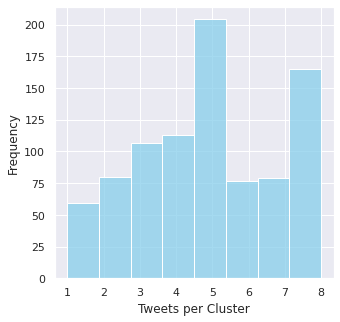

In [ ]:
%%time
# 1. Set k
k=8

# 2. Cluster with K-Mean
kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=1000, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(safetyTweets.TweetVectors.to_list())+1

# 3. Add Topic to Results
safetyTweets['Topic'] = pred_y

# 5. Settings for seaborn plotting style
sns.set(color_codes=True)

# 6. Settings for seaborn plot sizes
sns.set(rc={'figure.figsize':(5,5)})

# 7. Create Histogram
ax = sns.histplot(pred_y,
                  bins=k,
                  kde=False,
                  color='skyblue')
ax.set(xlabel='Tweets per Cluster', ylabel='Frequency')

####Explore subtopics

In [ ]:
# 2. Initialize new Column
safetyTweets['Relevance']=np.nan

# 3. Loop through all ientified Topics to calculate centrality of each tweet in its corresponding topic
for t in range(1,safetyTweets.Topic.max()+1):

    # a. Create topic DataFrame with tweets of topic t
    topic = safetyTweets[['Topic','TweetVectors']][safetyTweets.Topic==t]

    # b. Create a cosine similarity matrix (WARNING: If you have too many tweets then this matrix will get way to large for your system to handle!)
    cos_sim = sklearn.metrics.pairwise.cosine_similarity(topic.TweetVectors.to_list(),topic.TweetVectors.to_list())
    cos_sim[np.isnan(cos_sim)] = 1

    # c. Weighed Degree Centrality is the sum of a node's weighted edges = sum of cosine similarities to other vectors minus self-similarity
    topic['Relevance']=pd.Series((np.sum(cos_sim,axis=1)-1).tolist()).values.round(2)

    # d. #Re-Scale centraluty from 0 to 1
    topic['Relevance']=topic['Relevance']/topic['Relevance'].max()*100 

    # e. Drop Columns we don't need
    topic.drop(topic.columns[[0, 1]], axis = 1, inplace = True)

    # f. Update tweets dataframe with centrality for tweets in topic t
    safetyTweets.update(topic)

In [ ]:
# 4. Get most central N tweets in Topic t
t=2  # topic id
N=25 # number of most central tweets

# 5. Create object for most central tweets 
s = safetyTweets[safetyTweets.Topic==t].nlargest(N, columns=['Relevance']).stripped

# 6. Print most central tweets line by line
for index in s.index:
    print(s[index])

Uber driver dies after shooting in NE Portland
Those 13 and 15 year olds who killed that Uber driver in D.C. truly deserve to be prosecuted to the fullest extent
The main person who attacked the uber driver ain't even black yet this idiot uses this opportunity to go after African Americans. A tale as old as time 🙄
Uber driver about to pick up fare in NE Portland shot in car, unintended victim mistaken for rival in gang-style ambush, police suspect
Man shot to death while driving for Uber in Pittsburgh neighborhood, family says
Uber driver Pedro Fontes was up a passenger in Dorchester when an unknown attacker shot him in the head multiple times. Fontes, who barely survived, is accusing Uber of shorting him on the benefits due to workers injured on the job by
Ugh the video of the Uber driver that was killed is heartbreaking. Not one person walked up to him when he was just laying there. May he rest in peace🤍
Those two girls that stole the car from the Uber driver and killed him
Safety dr

####Interactive Map

In [ ]:
%%time

# 2. Instantiate and Fit t-SNE
X_tsne = TSNE(n_components=2, verbose=1, perplexity=25, n_iter=1000, learning_rate=25, random_state=21).fit_transform(safetyTweets.TweetVectors.to_list())

# 3. Save X,Y Coordinates in tweets DataFrame
safetyTweets['tSNE_X']=pd.Series((X_tsne[:, 0]).tolist()).values
safetyTweets['tSNE_Y']=pd.Series((X_tsne[:, 1]).tolist()).values

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 884 samples in 0.040s...
[t-SNE] Computed neighbors for 884 samples in 0.872s...
[t-SNE] Computed conditional probabilities for sample 884 / 884
[t-SNE] Mean sigma: 0.244127
[t-SNE] KL divergence after 100 iterations with early exaggeration: 67.922058
[t-SNE] KL divergence after 1000 iterations: 1.917558
CPU times: user 13.2 s, sys: 136 ms, total: 13.4 s
Wall time: 7.37 s


In [ ]:
# 1. Create a new DataFrame that holds all the information we need for our map

tweets = safetyTweets

source = pd.DataFrame(
    {'x': tweets['tSNE_X'],
     'y': tweets['tSNE_Y'],
     'txt': tweets["text"],
     'Topic' : tweets['Topic'],
     'Relevance' : tweets['Relevance']
    })


# 3. Define Bubbles on Map
bubbles = alt.Chart(source).mark_circle().encode(
    x=alt.X('x:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.x)-10, max(source.x)+20])),
    y=alt.Y('y:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.y)-10, max(source.y)+10])),
    #size='Relevance:Q',
    color = 'Topic:N',
    tooltip=[alt.Tooltip('txt', title='Tweet'),                            # We can include a lot of information in the tooltips (mouseover pop-up)
             alt.Tooltip('Topic', title='Topic'),
             alt.Tooltip('Relevance', title='Relevance')
            ]
)

# 4. Visualizes tweets in an interactive Map
bubbles.encode(text='txt').interactive().properties(height=700,width=700,title="Safety Tweets") 

alt.Chart(...)



1.   Dark Blue - Uber and religion, mention of terrorism and racism
2.   Orange - Uber driver safety - stories of uber drivers getting murdered or assaulted
3.   Red - seems to be about working as an uber driver or that profession in general
4.   Light Blue - Mentions of Trump and politics in general
5.   Green - pretty random tweets thats mainly contain curse words
6.   Yellow - words like unsettling, torture, stalking but these also seem kind of random
7.   Purple - Uber drivers getting assaulted, very similar to Orange
8.   Pink - Mainly contains tweets with the word "she"




### Uber Safety Sentiment over Time

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


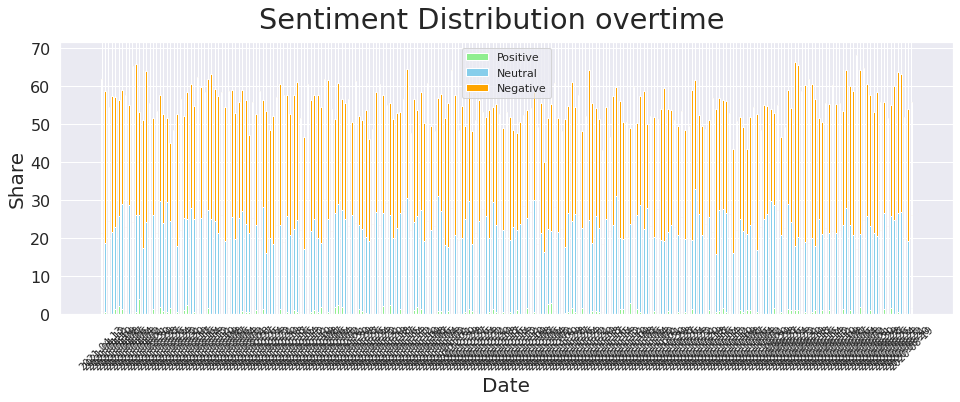

In [ ]:
safetyTweets['date'] = pd.to_datetime(safetyTweets['day'])
safetyTweets['day'] = [one.date() for one in safetyTweets['date']]
safetyTweets = safetyTweets.sort_values(by=['day'])

sentiments = ["Positive", "Neutral", "Negative"]
positiveProps = (safetyTweets[uberTweets.Sentiment == 'Positive'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
neutralProps = (uberTweets[uberTweets.Sentiment == 'Neutral'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
negativeProps = (uberTweets[uberTweets.Sentiment == 'Negative'].groupby(['day']).count()[['Sentiment']]/ uberTweets.groupby(['day']).count()[['Sentiment']])*100
 
positiveProps = positiveProps['Sentiment'].tolist()
neutralProps = neutralProps['Sentiment'].tolist()
negativeProps = negativeProps['Sentiment'].tolist()
plt.figure(figsize=[16, 5])
barWidth = 0.5
labels = uberTweets.day.unique()
r = np.arange(len(labels))
positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.bar(r,positiveProps, color='lightgreen', edgecolor='white', width=barWidth)
plt.bar(r, neutralProps, bottom=positiveProps, color='skyblue', edgecolor='white', width=barWidth)
plt.bar(r, negativeProps, bottom=[i+j for i,j in zip(positiveProps, neutralProps)], color='orange', edgecolor='white', width=barWidth)
 
plt.xticks( r, labels, rotation = 45, fontsize=10)
plt.yticks(fontsize=16)
plt.suptitle('Sentiment Distribution overtime')
plt.xlabel("Date", fontsize=20)
plt.ylabel("Share", fontsize=20)
plt.legend(sentiments)
plt.show()
# Sort by Index again
uberTweets.sort_index(inplace=True)

223


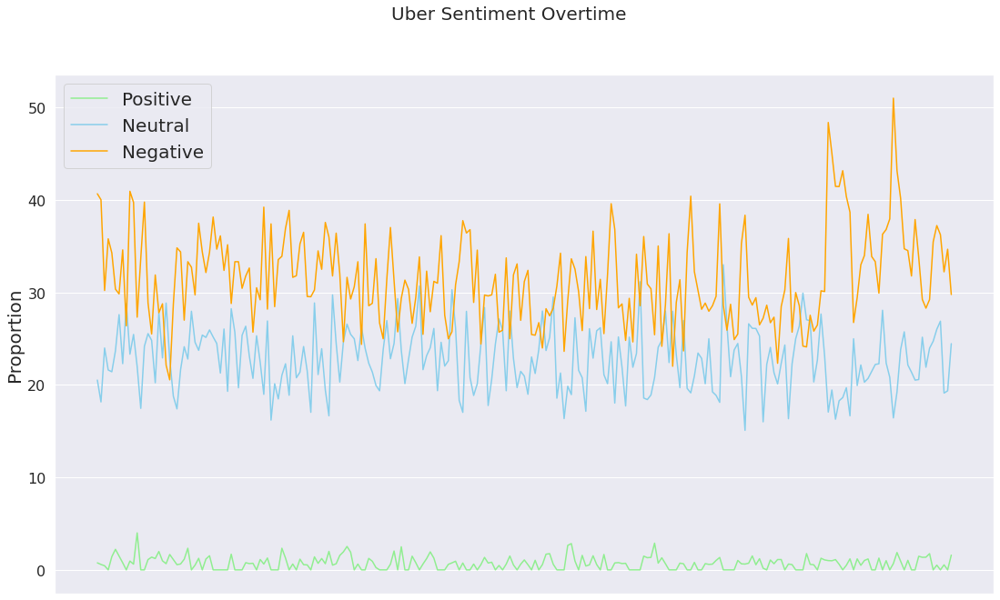

In [ ]:
import math
import matplotlib.dates as mdate
uberTweets['date'] = pd.to_datetime(safetyTweets['day'])
uberTweets['date'] = [one.date() for one in uberTweets['date']]
uberTweets = uberTweets.sort_values(by=['date'])

plt.figure(figsize=[16,5])
barWidth = 0.5
labels = uberTweets.date.unique()
print(labels.size)

positiveProps = [0 if math.isnan(x) else x for x in positiveProps]
neutralProps = [0 if math.isnan(x) else x for x in neutralProps]
negativeProps = [0 if math.isnan(x) else x for x in negativeProps]

plt.plot(positiveProps, color='lightgreen')
plt.plot(neutralProps, color='skyblue')
plt.plot(negativeProps, color='orange')

plt.yticks(fontsize=16)
plt.suptitle("Uber Sentiment Overtime", fontsize=20)
plt.ylabel("Proportion", fontsize=20)
plt.legend(sentiments, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(18.5, 10.5)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
uberTweets.sort_index(inplace=True)

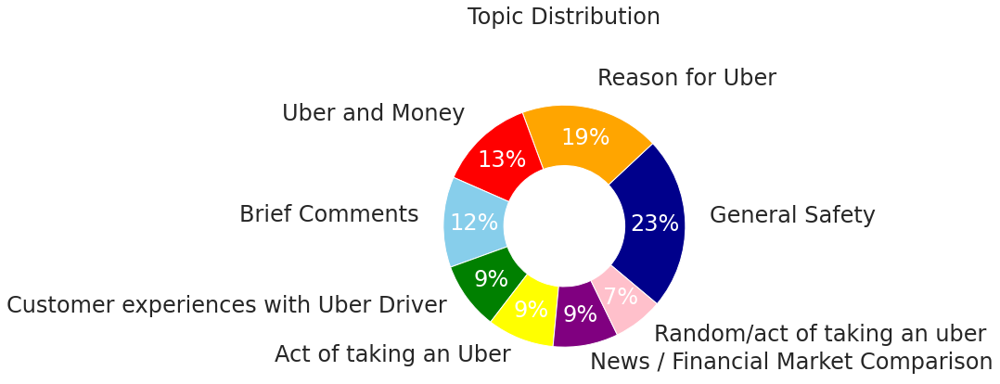

In [ ]:
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))
Topics = ["General Safety", "Reason for Uber", "Uber and Money","Brief Comments","Customer experiences with Uber Driver","Act of taking an Uber","News / Financial Market Comparison","Random/act of taking an uber"]

# Get count by Topic category from tweets_df
Topic_counts = tweets.Topic.value_counts()
labels = Topics 

# Define colors
color_palette_list = ['darkblue', 'orange', 'red','skyblue','green','yellow','purple','pink']

# Generate graph components
wedges, texts, autotexts = ax.pie(Topic_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w"})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Topic Distribution", y=1.15, fontsize = 24)

# Show Donut Chart
plt.show()

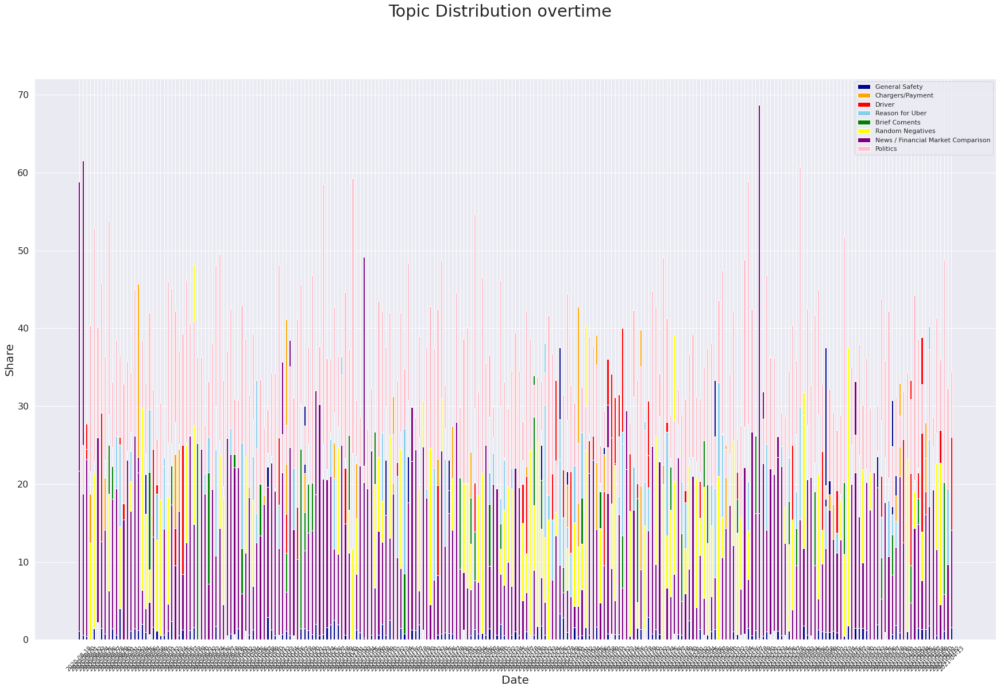

In [ ]:
import math
import matplotlib.dates as mdate
import matplotlib.pyplot as plt

tweets['date'] = tweets['date'].astype("datetime64")
tweets['day'] = [one.date() for one in tweets['date']]
tweets['month'] = tweets['date'].dt.month
tweets['month'] = tweets['month'].astype("datetime64[ns]")
tweets['year'] = tweets['date'].dt.year
tweets = tweets.sort_values(by=['day'])

Topics = ["General Safety", "Chargers/Payment", "Driver","Reason for Uber","Brief Coments","Random Negatives","News / Financial Market Comparison","Politics"]

general_safety = (tweets[tweets.Topic == 1].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
finances = (tweets[tweets.Topic == 2].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
driver = (tweets[tweets.Topic == 3].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
reason_for_uber = (tweets[tweets.Topic == 4].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
brief_comments = (tweets[tweets.Topic == 5].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
random_negatives = (tweets[tweets.Topic == 6].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
market_comparison = (tweets[tweets.Topic == 7].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100
politics = (tweets[tweets.Topic == 8].groupby(['date']).count()[['Topic']]/ tweets.groupby(['date']).count()[['Topic']])*100


general_safety = general_safety['Topic'].tolist()
finances = finances['Topic'].tolist()
driver = driver['Topic'].tolist()
reason_for_uber = reason_for_uber['Topic'].tolist()
brief_comments = brief_comments['Topic'].tolist()
random_negatives = random_negatives['Topic'].tolist()
market_comparison = market_comparison['Topic'].tolist()
politics = politics['Topic'].tolist()


plt.figure(figsize=[30, 18])
barWidth = 0.5
labels = tweets.day.unique()
r = np.arange(len(labels))


general_safety = [0 if math.isnan(x) else x for x in general_safety]
finances = [0 if math.isnan(x) else x for x in finances]
driver = [0 if math.isnan(x) else x for x in driver]
reason_for_uber = [0 if math.isnan(x) else x for x in reason_for_uber]
brief_comments = [0 if math.isnan(x) else x for x in brief_comments]
random_negatives = [0 if math.isnan(x) else x for x in random_negatives]
market_comparison = [0 if math.isnan(x) else x for x in market_comparison]
politics = [0 if math.isnan(x) else x for x in politics]

plt.bar(r,general_safety, color='darkblue', edgecolor='white', width=barWidth)
plt.bar(r, finances, bottom=positiveProps, color='orange', edgecolor='white', width=barWidth)
plt.bar(r, driver, bottom=positiveProps, color='red', edgecolor='white', width=barWidth)
plt.bar(r, reason_for_uber, bottom=positiveProps, color='skyblue', edgecolor='white', width=barWidth)
plt.bar(r, brief_comments, bottom=positiveProps, color='green', edgecolor='white', width=barWidth)
plt.bar(r, random_negatives, bottom=positiveProps, color='yellow', edgecolor='white', width=barWidth)
plt.bar(r, market_comparison, bottom=positiveProps, color='purple', edgecolor='white', width=barWidth)
plt.bar(r, politics, bottom=[i+j for i,j in zip(positiveProps, neutralProps)], color='pink', edgecolor='white', width=barWidth)
 
plt.xticks( r, labels, rotation = 45, fontsize=10)
plt.yticks(fontsize=16)
plt.suptitle('Topic Distribution overtime')
plt.xlabel("Date", fontsize=20)
plt.ylabel("Share", fontsize=20)
plt.legend(Topics)
plt.show()
# Sort by Index again
uberTweets.sort_index(inplace=True)

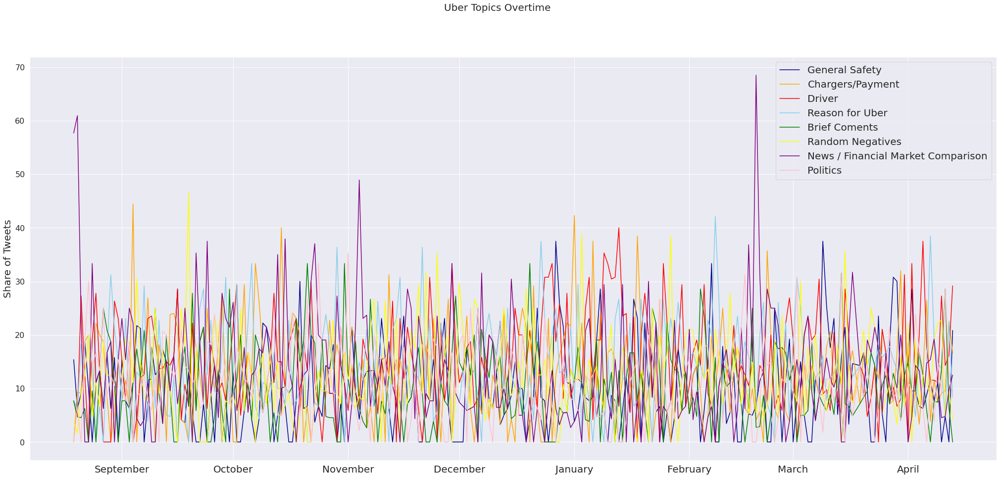

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

general_safety = [0 if math.isnan(x) else x for x in general_safety]
finances = [0 if math.isnan(x) else x for x in finances]
driver = [0 if math.isnan(x) else x for x in driver]
reason_for_uber = [0 if math.isnan(x) else x for x in reason_for_uber]
brief_comments = [0 if math.isnan(x) else x for x in brief_comments]
random_negatives = [0 if math.isnan(x) else x for x in random_negatives]
market_comparison = [0 if math.isnan(x) else x for x in market_comparison]
politics = [0 if math.isnan(x) else x for x in politics]

plt.plot(labels, general_safety, color='darkblue')
plt.plot(labels, finances, color='orange')
plt.plot(labels, driver, color='red')
plt.plot(labels, reason_for_uber, color='skyblue')
plt.plot(labels, brief_comments, color='green')
plt.plot(labels, random_negatives, color='yellow')
plt.plot(labels, market_comparison, color='purple')
plt.plot(labels, politics, color='pink')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

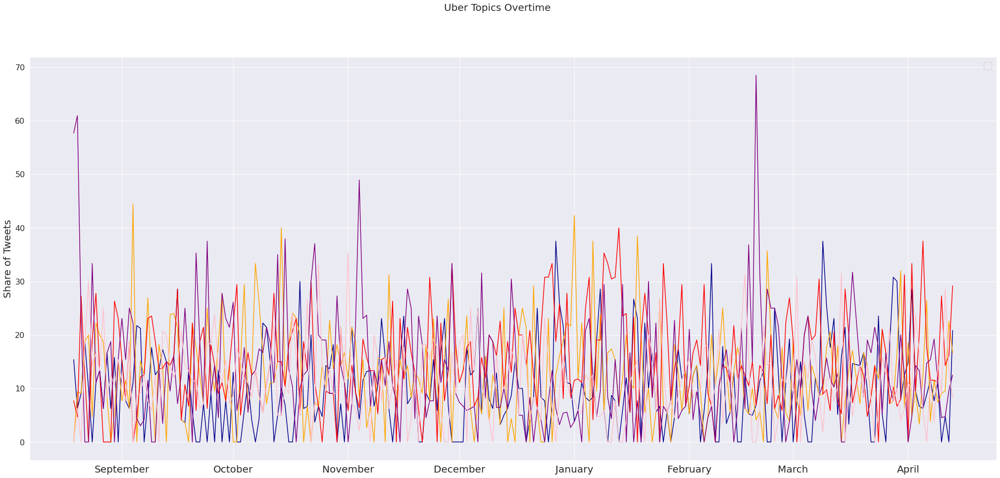

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

general_safety = [0 if math.isnan(x) else x for x in general_safety]
finances = [0 if math.isnan(x) else x for x in finances]
driver = [0 if math.isnan(x) else x for x in driver]
reason_for_uber = [0 if math.isnan(x) else x for x in reason_for_uber]
brief_comments = [0 if math.isnan(x) else x for x in brief_comments]
random_negatives = [0 if math.isnan(x) else x for x in random_negatives]
market_comparison = [0 if math.isnan(x) else x for x in market_comparison]
politics = [0 if math.isnan(x) else x for x in politics]

plt.plot(labels, general_safety, color='darkblue')
plt.plot(labels, finances, color='orange')
plt.plot(labels, driver, color='red')
#plt.plot(labels, reason_for_uber, color='skyblue')
#plt.plot(labels, brief_comments, color='green')
#plt.plot(labels, random_negatives, color='yellow')
plt.plot(labels, market_comparison, color='purple')
plt.plot(labels, politics, color='pink')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

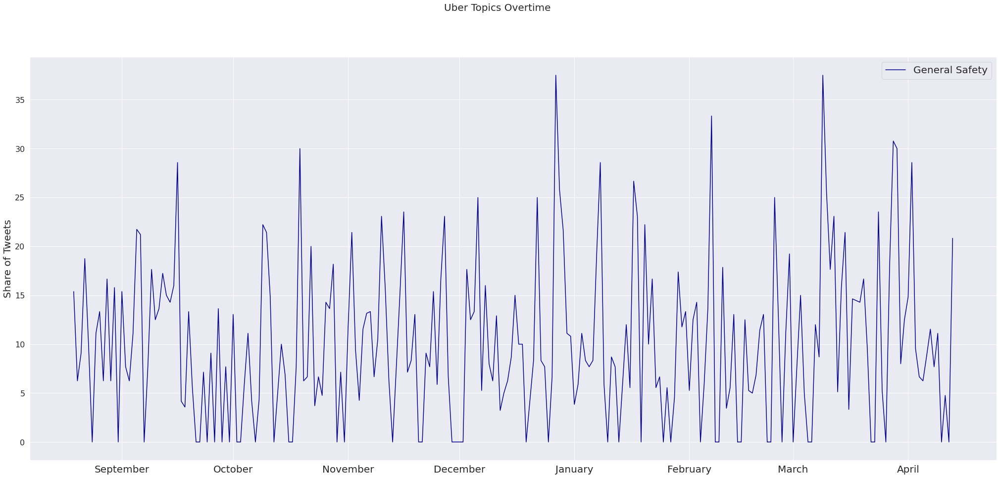

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[10,4])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, general_safety, color='darkblue')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

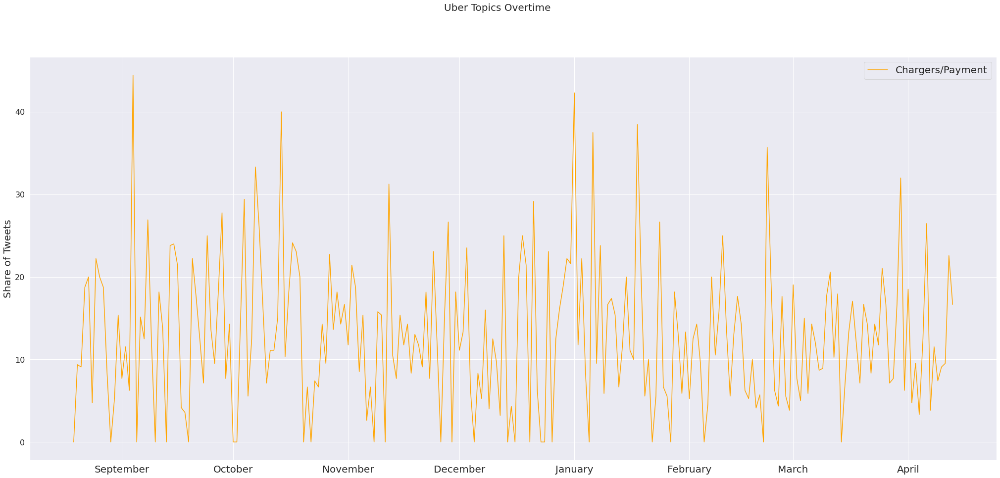

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, finances, color='orange')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[1:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

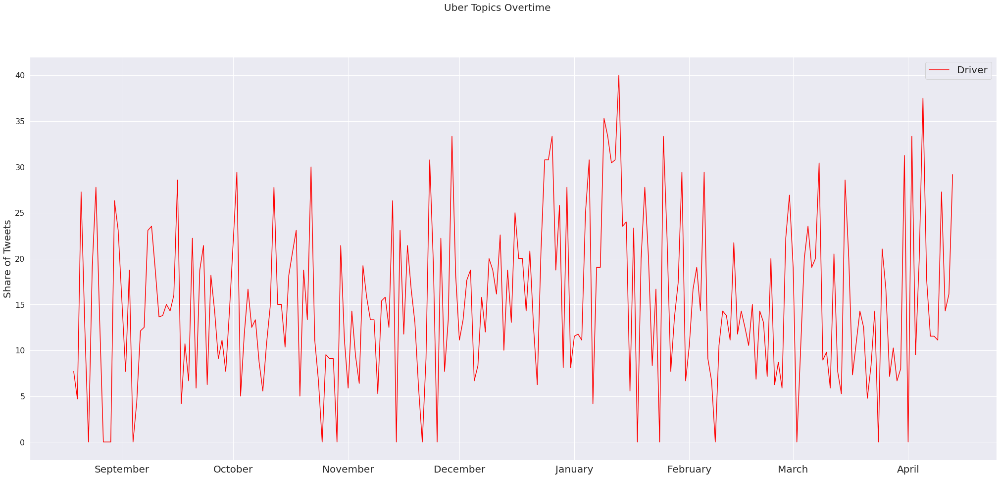

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, driver, color='red')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[2:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

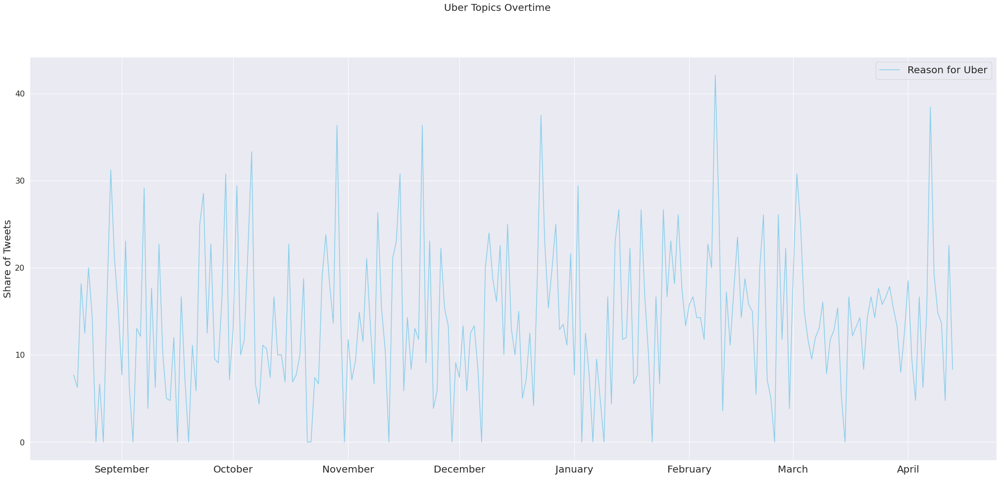

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, reason_for_uber, color='skyblue')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[3:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

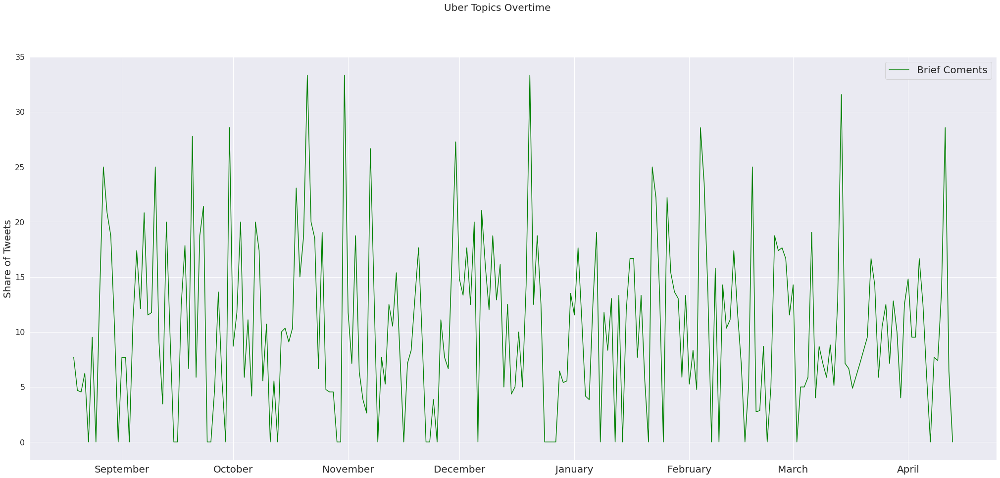

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, brief_comments, color='green')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[4:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

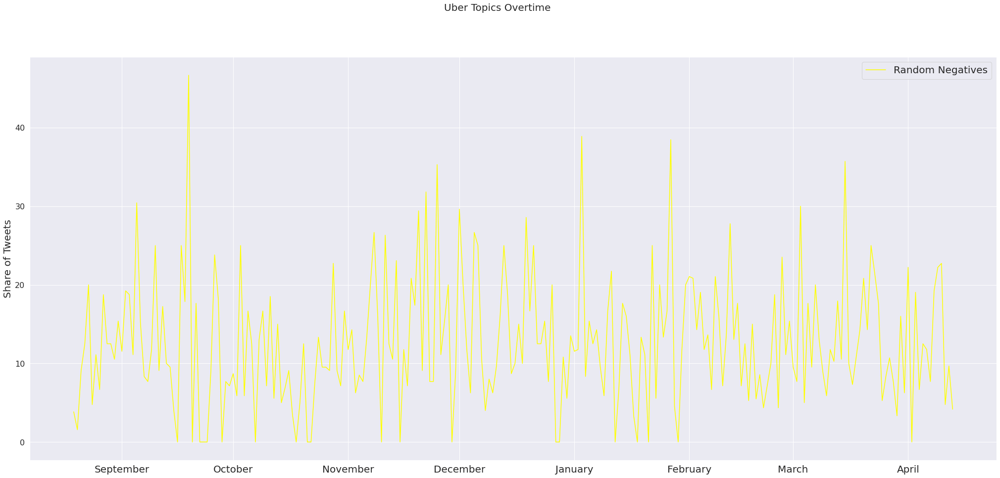

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, random_negatives, color='yellow')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[5:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

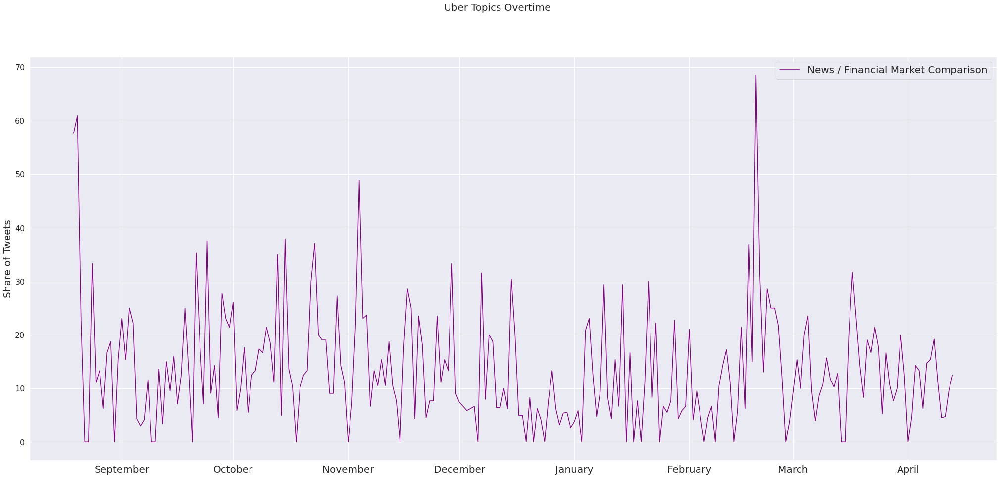

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, market_comparison, color='purple')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[6:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

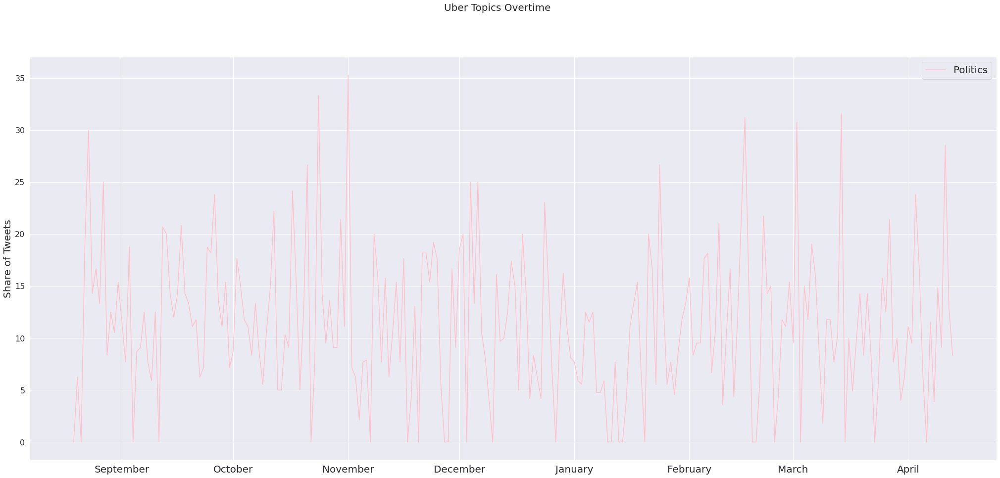

In [ ]:
import math
import matplotlib.dates as mdate
tweets['date'] = tweets['date'].astype("datetime64")
tweets['date'] = [one.date() for one in tweets['date']]
tweets = tweets.sort_values(by=['date'])

plt.figure(figsize=[10,4])
barWidth = 0.5
labels = tweets.date.unique()

plt.plot(labels, politics, color='pink')

plt.yticks(fontsize=16)
plt.suptitle("Uber Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics[7:], fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
tweets.sort_index(inplace=True)

# Lyft Topics Over Time

In [ ]:
lyft_tweets = lyftTweets.sample(5000, random_state=42)
lyft_tweets

,id,content,date,user,retweetCount,likeCount,text,stripped,Lyftthemselves,C_Score,Sentiment,day,Safety
3867,1377276788628414464,Lyft generates average quarterly revenue of $45.40 per active rider. https://t.co/1MXK3K2fUW via @backlinko #digitalmarketingstrategy #branding #entrepreneur,2021-03-31,"{'username': 'Marketing101__', 'displayname': 'Marketing 101', 'id': 1282231914884022272, 'description': 'Learn How To Market Yourself Like A F*****g Boss.', 'rawDescription': 'Learn How To Market Yourself Like A F*****g Boss.', 'descriptionUrls': [], 'verified': False, 'created': '2020-07-12T08:34:57+00:00', 'followersCount': 222, 'friendsCount': 3, 'statusesCount': 8134, 'favouritesCount': 10366, 'listedCount': 4, 'mediaCount': 0, 'location': '', 'protected': False, 'linkUrl': None, 'linkTcourl': None, 'profileImageUrl': 'https://pbs.twimg.com/profile_images/1282274582066421762/DTX8sDjJ_normal.jpg', 'profileBannerUrl': 'https://pbs.twimg.com/profile_banners/1282231914884022272/1594543983', 'url': 'https://twitter.com/Marketing101__'}",0,4,Lyft generates average quarterly revenue of $45.40 per active rider. via,Lyft generates average quarterly revenue of $45.40 per active rider. via,0,0.4019,Positive,2021-03-31,0
15288,1369485451401302020,@arturostevens @CRShort81 @AJDelgado13 @davenewworld_2 @Uber It’s why I prefer @lyft. @Uber is trash.,2021-03-10,"{'username': 'daysofthvnder', 'displayname': 'sᴛᴇᴠᴇɴ ᴀɴᴅʀᴇᴡ', 'id': 1123024593780916230, 'description': '30 • photography • 🏳️‍🌈 • horror • he/him • butts • blm', 'rawDescription': '30 • photography • 🏳️‍🌈 • horror • he/him • butts • blm', 'descriptionUrls': [], 'verified': False, 'created': '2019-04-30T00:41:42+00:00', 'followersCount': 46, 'friendsCount': 41, 'statusesCount': 1315, 'favouritesCount': 696, 'listedCount': 1, 'mediaCount': 112, 'location': '', 'protected': False, 'linkUrl': None, 'linkTcourl': None, 'profileImageUrl': 'https://pbs.twimg.com/profile_images/1282490685078278145/6Z_bO9wP_normal.jpg', 'profileBannerUrl': 'https://pbs.twimg.com/profile_banners/1123024593780916230/1613958388', 'url': 'https://twitter.com/daysofthvnder'}",0,2,It’s why I prefer . is trash.,It’s why I prefer . is trash.,0,0.0000,Neutral,2021-03-10,0
21230,1362514950380392451,@EcoethicD @Rias_GremoryKig @crowage1 @elonmusk @ERCOT_ISO V2H paired with distributed generation at work is the way. Opens up entire peer-to-per power sharing marketplaces akin to Uber / Lyft in the future but for mobile excess electricity generation capacity and storage capacity.,2021-02-18,"{'username': 'EVolutionary_CA', 'displayname': 'CA_Visionary', 'id': 796596210102452225, 'description': 'Ai Car Culture #Election2016 Technology & Science Tesla Announcement Tech Influencers Science Science & Technology Humanitarian', 'rawDescription': 'Ai Car Culture #Election2016 Technology & Science Tesla Announcement Tech Influencers Science Science & Technology Humanitarian', 'descriptionUrls': [], 'verified': False, 'created': '2016-11-10T06:11:51+00:00', 'followersCount': 79, 'friendsCount': 347, 'statusesCount': 3213, 'favouritesCount': 2884, 'listedCount': 1, 'mediaCount': 17, 'location': 'Los Angeles, CA', 'protected': False, 'linkUrl': None, 'linkTcourl': None, 'profileImageUrl': 'https://pbs.twimg.com/profile_images/799421961377984512/8T5xz3-G_normal.jpg', 'profileBannerUrl': 'https://pbs.twimg.com/profile_banners/796596210102452225/1479229266', 'url': 'https://twitter.com/EVolutionary_CA'}",0,2,V2H paired with distributed generation at work is the way. Opens up entire peer-to-per power sharing marketplaces akin to Uber / Lyft in the future but for mobile excess electricity generation capacity and storage capacity.,V2H paired with distributed generation at work is the way. Opens up entire peer-to-per power sharing marketplaces akin to Uber / Lyft in the future but for mobile excess electricity generation capacity and storage capacity.,0,0.2263,Positive,2021-02-18,0
64707,1322367093136744449,Omg you guys. I’m in a Lyft and the 

###Identifying Major Topics in Lyft Tweets

In [ ]:
# 2. Load USE pre-trained model
module_url = "https://tfhub.dev/google/universal-sentence-encoder-large/5"
embed = hub.load(module_url) #download and load the model
print("Done!")

Done!


####Embed tweets into feature vectors

For the interactive map portion we have to have a smaller data set so we will use smallUberTweets which has 10,000 tweets

In [ ]:
%%time

# 1. Create a unique input ID (to the USE model) for each tweet - we will simply use the index of the tweet DataFrame
input_ids = lyft_tweets.index

# 2. We will send the tweets for embeding to USE in batches (commonly done to ensure that we don't run out of RAM during the embeddig process)
batch_size = 1000
n_of_iterations = (input_ids.shape[0] + batch_size - 1) // batch_size
display(f"Number of Batches: {n_of_iterations}")

# 3. Create a Dataframe that will hold the feature vectors
FeatureVectors = pd.DataFrame(columns = ['TweetVectors'])#, index = test.index)

# 4. Send tweets batch by batch to USE
for i in range(n_of_iterations): 
    use_vecs = pd.DataFrame(index=lyft_tweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']].index)
    embeddings = embed(lyft_tweets.loc[input_ids[i*batch_size:(i+1)*batch_size],['stripped']]['stripped'])
    use_vecs['TweetVectors'] = pd.Series(np.array(embeddings).tolist(), index=use_vecs.index) 
    FeatureVectors = pd.concat([FeatureVectors,use_vecs])

'Number of Batches: 5'

CPU times: user 3min 23s, sys: 3.9 s, total: 3min 27s
Wall time: 1min 55s


In [ ]:
# 5. Add Feature Vectors to tweets DataFrane
lyft_tweets = pd.concat([lyft_tweets, FeatureVectors], axis=1)

In [ ]:
# Let's take a look!
lyft_tweets.head(5)

,id,content,date,user,retweetCount,likeCount,text,stripped,Lyftthemselves,C_Score,Sentiment,day,Safety,TweetVectors
3867,1377276788628414464,Lyft generates average quarterly revenue of $45.40 per active rider. https://t.co/1MXK3K2fUW via @backlinko #digitalmarketingstrategy #branding #entrepreneur,2021-03-31,"{'username': 'Marketing101__', 'displayname': 'Marketing 101', 'id': 1282231914884022272, 'description': 'Learn How To Market Yourself Like A F*****g Boss.', 'rawDescription': 'Learn How To Market Yourself Like A F*****g Boss.', 'descriptionUrls': [], 'verified': False, 'created': '2020-07-12T08:34:57+00:00', 'followersCount': 222, 'friendsCount': 3, 'statusesCount': 8134, 'favouritesCount': 10366, 'listedCount': 4, 'mediaCount': 0, 'location': '', 'protected': False, 'linkUrl': None, 'linkTcourl': None, 'profileImageUrl': 'https://pbs.twimg.com/profile_images/1282274582066421762/DTX8sDjJ_normal.jpg', 'profileBannerUrl': 'https://pbs.twimg.com/profile_banners/1282231914884022272/1594543983', 'url': 'https://twitter.com/Marketing101__'}",0,4,Lyft generates average quarterly revenue of $45.40 per active rider. via,Lyft generates average quarterly revenue of $45.40 per active rider. via,0,0.4019,Positive,2021-03-31,0,"[0.04822985827922821, -0.04454203322529793, -0.06557522714138031, -0.01841706968843937, 0.060639768838882446, 0.01765635795891285, 0.011164291761815548, -0.019384583458304405, 0.06248927488923073, 0.04102656617760658, -0.1148291602730751, 0.08554475754499435, 0.035261817276477814, 0.016268115490674973, 0.04064201936125755, -0.01836702786386013, -0.059517934918403625, 0.024281254038214684, -0.08522635698318481, -0.03533056378364563, 0.06721348315477371, -0.006559658795595169, -0.005776534788310528, 0.06099257245659828, 0.010553439147770405, -0.0462220199406147, -0.007487928494811058, 0.007524367421865463, 0.026386942714452744, 0.043789543211460114, -0.0505576953291893, -0.03484637290239334, 0.02728247083723545, 0.007419960107654333, -0.02948806993663311, -0.05836247280240059, 0.0348491407930851, 0.045579150319099426, -0.06808305531740189, -0.03392309695482254, 0.029223769903182983, 0.04558176174759865, -0.0017593719530850649, 0.01952224224805832, -0.06968715786933899, 0.043613120913505554, 0.0018086736090481281, 0.03826073184609413, -0.04794631525874138, -0.07030659168958664, -0.02298111841082573, 0.019350554794073105, -0.008378489874303341, 0.0991092175245285, 0.050685200840234756, -0.028060846030712128, -0.003219002392143011, -0.03519932180643082, 0.07453840225934982, -0.052697230130434036, -0.0037720436230301857, 0.1029428020119667, -0.00634095910936594, -0.011981489136815071, -0.04458830878138542, 0.00042492401553317904, 0.0207231268286705, 0.028595948591828346, -0.04751315712928772, 0.09342134743928909, 0.006657789461314678, -0.02209131233394146, 0.03129218518733978, -0.005987395532429218, -0.051940470933914185, 0.005507849156856537, 0.03265569359064102, -0.04487564414739609, 0.035494670271873474, 0.013883076608181, -0.001480642706155777, 0.07331399619579315, -0.051601577550172806, -0.041582729667425156, 0.00738679850474, 0.08959025144577026, -0.05618526414036751, -0.017663955688476562, 0.03412555530667305, -0.07202153652906418, 0.006444787140935659, 0.005266895052045584, -0.03525734692811966, 0.05637345463037491, -0.01077431719750166, 0.082727812230587, 0.02203533798456192, -0.01563902199268341, -0.0029760017059743404, 0.0423685684800148, ...]"
15288,1369485451401302020,@arturostevens @CRShort81 @AJDelgado13 @davenewworld_2 @Uber It’s why I prefer @lyft. @Uber is trash.,2021-03-10,"{'username': 'daysofthvnder', 'displayname': 'sᴛᴇᴠᴇɴ ᴀɴᴅʀᴇᴡ', 'id': 1123024593780916230, 'description': '30 • photography • 🏳️‍🌈 • horror • he/him • butts • blm', 'rawDescription': '30 • photography • 🏳️‍🌈 • horror • he/him • butts • blm', 'descriptionUrls': [], 'verified': False, 'created': '2019-04-30T00:41:42+00:00', 'followersCount': 46, 'friendsCount': 41, 'statusesCount': 1315, 'favouritesCount': 696, 'listedCount': 1, 'me

####Outlier Removal

In [ ]:


# 2. Get vectors from dataframe
tweet_embeddings = lyft_tweets.TweetVectors.to_list()

# 3. Set share of outliers to detect and remove
outliers_fraction = 0.1

# 4. Instantiate, fit and predict (note that by removing the hyperparameter "contamination" the model will try to detrmine the number of outliers itself)
isf = IsolationForest(contamination=outliers_fraction,random_state=42, n_jobs=-1)
y_pred = isf.fit(tweet_embeddings).predict(tweet_embeddings)

# 5. How many outliers identified?
print(f"Number of detected outliers is {(y_pred == -1).sum()}")

Number of detected outliers is 500


In [ ]:
# 6. Create list of indices of outliers
result = np.where(y_pred == -1)
remove=result[0].tolist()

# 7. Delete outliers
print(f"Number of embedded tweets in array before outlier removal is {len(tweet_embeddings)}")  
for i in sorted(remove, reverse=True):
    del tweet_embeddings[i]
print(f"Number of embedded tweets in array after outlier removal is {len(tweet_embeddings)}")    

print(f"Number of records in tweets dataframe before outlier removal is {lyft_tweets.shape}")    
lyft_tweets.drop(lyft_tweets.index[remove], inplace=True)
print(f"Number of records in tweets dataframe before outlier removal is {lyft_tweets.shape}")    

Number of embedded tweets in array before outlier removal is 5000
Number of embedded tweets in array after outlier removal is 4500
Number of records in tweets dataframe before outlier removal is (5000, 14)
Number of records in tweets dataframe before outlier removal is (4500, 14)


#### Find number of Topics

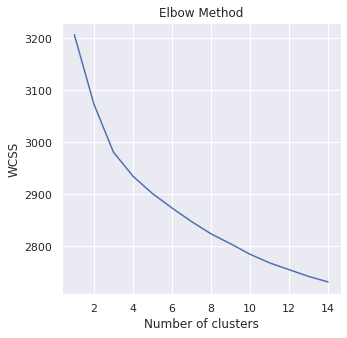

CPU times: user 1min 24s, sys: 35.4 s, total: 2min
Wall time: 1min 16s


In [ ]:
%%time


# 2. Create an array of tweet vectors to pass as feature vectors to k-Means clustering
wcss = []

# 3. Cluster for various k
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=1000, n_init=10, random_state=0)
    kmeans.fit(lyft_tweets.TweetVectors.to_list())
    wcss.append(kmeans.inertia_)

# 4. Plot Elbow Chart
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### Inspect Topic Size Distribution

CPU times: user 6.11 s, sys: 1.24 s, total: 7.35 s
Wall time: 5.78 s


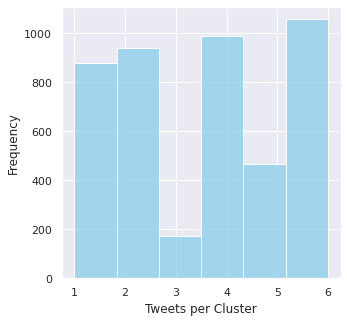

In [ ]:
%%time
# 1. Set k
k=6

# 2. Cluster with K-Mean
kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=1000, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(lyft_tweets.TweetVectors.to_list())+1

# 3. Add Topic to Results
lyft_tweets['Topic'] = pred_y



# 5. Settings for seaborn plotting style
sns.set(color_codes=True)

# 6. Settings for seaborn plot sizes
sns.set(rc={'figure.figsize':(5,5)})

# 7. Create Histogram
ax = sns.histplot(pred_y,
                  bins=k,
                  kde=False,
                  color='skyblue')
ax.set(xlabel='Tweets per Cluster', ylabel='Frequency')

#### Explore topics

In [ ]:


# 2. Initialize new Column
lyft_tweets['Relevance']=np.nan

# 3. Loop through all ientified Topics to calculate centrality of each tweet in its corresponding topic
for t in range(1,lyft_tweets.Topic.max()+1):

    # a. Create topic DataFrame with tweets of topic t
    topic = lyft_tweets[['Topic','TweetVectors']][lyft_tweets.Topic==t]

    # b. Create a cosine similarity matrix (WARNING: If you have too many tweets then this matrix will get way to large for your system to handle!)
    cos_sim = sklearn.metrics.pairwise.cosine_similarity(topic.TweetVectors.to_list(),topic.TweetVectors.to_list())
    cos_sim[np.isnan(cos_sim)] = 1

    # c. Weighed Degree Centrality is the sum of a node's weighted edges = sum of cosine similarities to other vectors minus self-similarity
    topic['Relevance']=pd.Series((np.sum(cos_sim,axis=1)-1).tolist()).values.round(2)

    # d. #Re-Scale centraluty from 0 to 1
    topic['Relevance']=topic['Relevance']/topic['Relevance'].max()*100 

    # e. Drop Columns we don't need
    topic.drop(topic.columns[[0, 1]], axis = 1, inplace = True)

    # f. Update tweets dataframe with centrality for tweets in topic t
    lyft_tweets.update(topic)

***Let's take a look at the Top 25 most central tweets in several topics***

In [ ]:
# 4. Get most central N tweets in Topic t
t=4  # topic id
N=25 # number of most central tweets

# 5. Create object for most central tweets 
s = lyft_tweets[lyft_tweets.Topic==t].nlargest(N, columns=['Relevance']).stripped

# 6. Print most central tweets line by line
for index in s.index:
    print(s[index])

Remind me not to use Lyft again
Honestly fuck Lyft
HAHAA FUCK YOU UBER AND LYFT GET FUUUCCKKEEDD
Yea this why i fuck with Lyft
Uber and lyft suck now
I hate Lyft so much skwkwmwksnwn
Thank God for Lyft
if Uber fucks you over go to Lyft.
Lyft knows what’s up 😂😂
i fucking hate using lyft
Don’t nobody do Uber or Lyft anymore? 😭
I’m on Uber this shit feel like a lyft route🤦🏿‍♀️
These Uber and Lyft prices are really getting out of hand.
Uber and Lyft have been trifling lately I swear to god it's horrible.
And this is why I ride Lyft
Yikes. I’ll start using Lyft now just in case.
Uber and Lyft have been letting me down recently smh
lyft is a bitch and then you die
Lyft offering car rental services now. That was a good move I guess.
Smart move from Lyft
fuck uber lol guess i'll try my hand a lyft again even tho they're more expensive
Lyft has arrived on the scene
Lyft over Uber foevaaa and you can’t convince me otherwise
"thanks for the uber" me, knowing it was just a lyft:
Fuck Lyft and Uber

A lot of these have to do with uber and money but also availability of uber

Maybe there are less uber drivers because of the pandemic but people are starting to want to go places? Prices are high and there are not many drivers. On Uber's website they have taken steps to ensure customer's safety (probably not enought but still) and less steps to ensure driver's safety.

####Interactive Map

In [ ]:
%%time


# 2. Instantiate and Fit t-SNE
X_tsne = TSNE(n_components=2, verbose=1, perplexity=25, n_iter=1000, learning_rate=25, random_state=21).fit_transform(lyft_tweets.TweetVectors.to_list())

# 3. Save X,Y Coordinates in tweets DataFrame
lyft_tweets['tSNE_X']=pd.Series((X_tsne[:, 0]).tolist()).values
lyft_tweets['tSNE_Y']=pd.Series((X_tsne[:, 1]).tolist()).values

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 4500 samples in 0.384s...
[t-SNE] Computed neighbors for 4500 samples in 27.857s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4500
[t-SNE] Computed conditional probabilities for sample 2000 / 4500
[t-SNE] Computed conditional probabilities for sample 3000 / 4500
[t-SNE] Computed conditional probabilities for sample 4000 / 4500
[t-SNE] Computed conditional probabilities for sample 4500 / 4500
[t-SNE] Mean sigma: 0.227138
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.812103
[t-SNE] KL divergence after 1000 iterations: 2.508124
CPU times: user 1min 45s, sys: 516 ms, total: 1min 45s
Wall time: 1min 7s


In [ ]:
# 1. Create a new DataFrame that holds all the information we need for our map


source = pd.DataFrame(
    {'x': lyft_tweets['tSNE_X'],
     'y': lyft_tweets['tSNE_Y'],
     'txt': lyft_tweets["text"],
     'Topic' : lyft_tweets['Topic'],
     'Relevance' : lyft_tweets['Relevance']
    })

# 3. Define Bubbles on Map
bubbles = alt.Chart(source).mark_circle().encode(
    x=alt.X('x:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.x)-10, max(source.x)+20])),
    y=alt.Y('y:Q', axis=alt.Axis(title="not directly interpretable", grid=False, labels=False),scale=alt.Scale(domain=[min(source.y)-10, max(source.y)+10])),
    #size='Relevance:Q',
    color = 'Topic:N',
    tooltip=[alt.Tooltip('txt', title='Tweet'),                            # We can include a lot of information in the tooltips (mouseover pop-up)
             alt.Tooltip('Topic', title='Topic'),
             alt.Tooltip('Relevance', title='Relevance')
            ]
)

# 4. Visualizes tweets in an interactive Map
bubbles.encode(text='txt').interactive().properties(height=700,width=700,title="Uber Tweets") 

alt.Chart(...)

Identify topics:

1. Orange - Prop 22 and Politics
2. Yellow - Driver Problems
3. Light Blue - General Negative Sentiment
4. Red - Lyft Promotions on Elections
5. Green - Stocks and Finance of Lyft and other companies
6. Blue - General Comments




## Lyft Topics Over Time

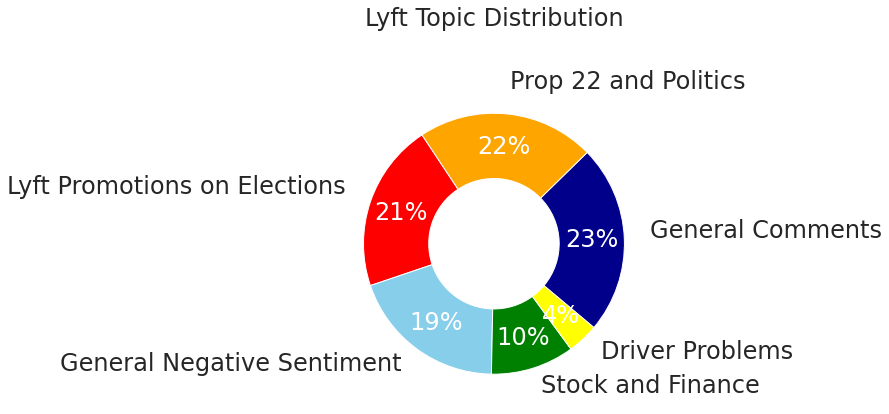

In [ ]:
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))
Topics = ["General Comments", "Prop 22 and Politics", "Lyft Promotions on Elections","General Negative Sentiment","Stock and Finance","Driver Problems"]


# Get count by Topic category from tweets_df
Topic_counts = lyft_tweets.Topic.value_counts()
labels = Topics 

# Define colors
color_palette_list = ['darkblue', 'orange', 'red','skyblue','green','yellow']

# Generate graph components
wedges, texts, autotexts = ax.pie(Topic_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w"})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Lyft Topic Distribution", y=1.15, fontsize = 24)

# Show Donut Chart
plt.show()

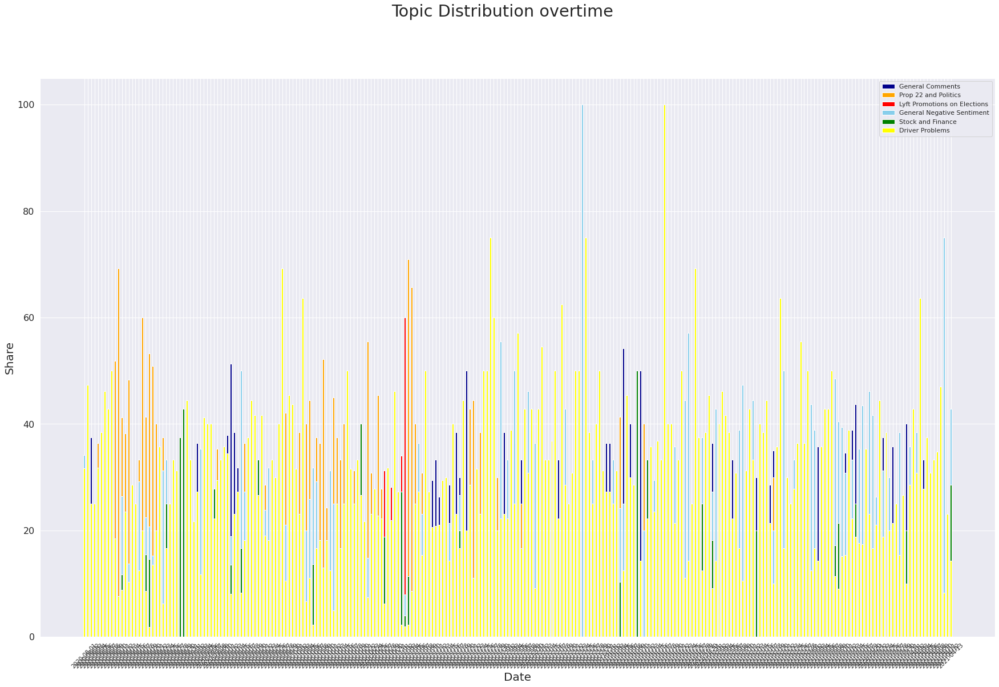

In [ ]:


lyft_tweets['date'] = lyft_tweets['date'].astype("datetime64")
lyft_tweets['day'] = [one.date() for one in lyft_tweets['date']]
lyft_tweets['month'] = lyft_tweets['date'].dt.month
lyft_tweets['month'] = lyft_tweets['month'].astype("datetime64[ns]")
lyft_tweets['year'] = lyft_tweets['date'].dt.year
lyft_tweets = lyft_tweets.sort_values(by=['day'])

Topics = ["General Comments", "Prop 22 and Politics", "Lyft Promotions on Elections","General Negative Sentiment","Stock and Finance","Driver Problems"]

general_safety = (lyft_tweets[lyft_tweets.Topic == 1].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100
finances = (lyft_tweets[lyft_tweets.Topic == 2].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100
driver = (lyft_tweets[lyft_tweets.Topic == 3].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100
reason_for_uber = (lyft_tweets[lyft_tweets.Topic == 4].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100
brief_comments = (lyft_tweets[lyft_tweets.Topic == 5].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100
random_negatives = (lyft_tweets[lyft_tweets.Topic == 6].groupby(['date']).count()[['Topic']]/ lyft_tweets.groupby(['date']).count()[['Topic']])*100


general_safety = general_safety['Topic'].tolist()
finances = finances['Topic'].tolist()
driver = driver['Topic'].tolist()
reason_for_uber = reason_for_uber['Topic'].tolist()
brief_comments = brief_comments['Topic'].tolist()
random_negatives = random_negatives['Topic'].tolist()


plt.figure(figsize=[30, 18])
barWidth = 0.5
labels = lyft_tweets.day.unique()
r = np.arange(len(labels))


general_safety = [0 if math.isnan(x) else x for x in general_safety]
finances = [0 if math.isnan(x) else x for x in finances]
driver = [0 if math.isnan(x) else x for x in driver]
reason_for_uber = [0 if math.isnan(x) else x for x in reason_for_uber]
brief_comments = [0 if math.isnan(x) else x for x in brief_comments]
random_negatives = [0 if math.isnan(x) else x for x in random_negatives]

plt.bar(r,general_safety, color='darkblue', edgecolor='white', width=barWidth)
plt.bar(r, finances, color='orange', edgecolor='white', width=barWidth)
plt.bar(r, driver, color='red', edgecolor='white', width=barWidth)
plt.bar(r, reason_for_uber, color='skyblue', edgecolor='white', width=barWidth)
plt.bar(r, brief_comments, color='green', edgecolor='white', width=barWidth)
plt.bar(r, random_negatives, color='yellow', edgecolor='white', width=barWidth)
 
plt.xticks( r, labels, rotation = 45, fontsize=10)
plt.yticks(fontsize=16)
plt.suptitle('Topic Distribution overtime')
plt.xlabel("Date", fontsize=20)
plt.ylabel("Share", fontsize=20)
plt.legend(Topics)
plt.show()
# Sort by Index again
lyft_tweets.sort_index(inplace=True)

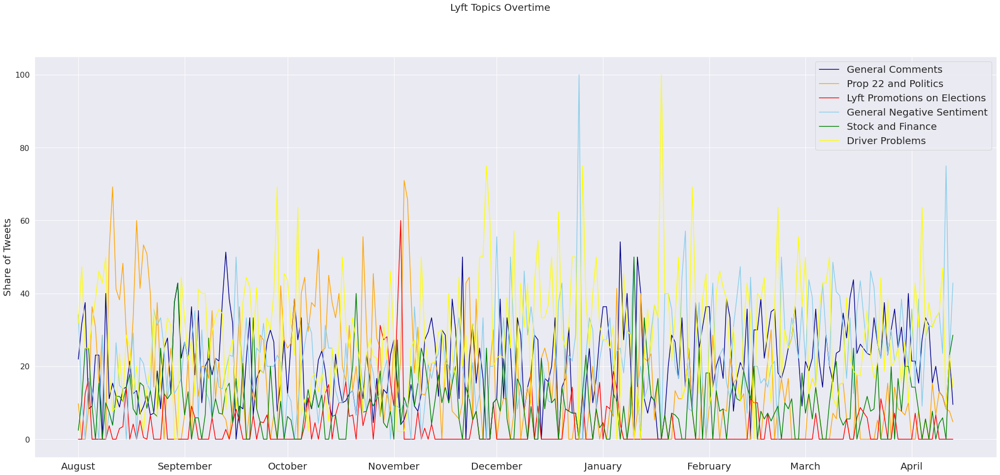

In [ ]:

lyft_tweets['date'] = lyft_tweets['date'].astype("datetime64")
lyft_tweets['date'] = [one.date() for one in lyft_tweets['date']]
lyft_tweets = lyft_tweets.sort_values(by=['date'])

plt.figure(figsize=[30,18])
barWidth = 0.5
labels = lyft_tweets.date.unique()

general_safety = [0 if math.isnan(x) else x for x in general_safety]
finances = [0 if math.isnan(x) else x for x in finances]
driver = [0 if math.isnan(x) else x for x in driver]
reason_for_uber = [0 if math.isnan(x) else x for x in reason_for_uber]
brief_comments = [0 if math.isnan(x) else x for x in brief_comments]
random_negatives = [0 if math.isnan(x) else x for x in random_negatives]

plt.plot(labels, general_safety, color='darkblue')
plt.plot(labels, finances, color='orange')
plt.plot(labels, driver, color='red')
plt.plot(labels, reason_for_uber, color='skyblue')
plt.plot(labels, brief_comments, color='green')
plt.plot(labels, random_negatives, color='yellow')

plt.yticks(fontsize=16)
plt.suptitle("Lyft Topics Overtime", fontsize=20)
plt.ylabel("Share of Tweets", fontsize=20)
plt.legend(Topics, fontsize=20)

mloc = mdate.MonthLocator()
dloc = mdate.DayLocator()
month_fmt = mdate.DateFormatter('%B')

plt.gca().xaxis.set_major_locator(mloc)
plt.gca().xaxis.set_major_formatter(month_fmt)
plt.gca().xaxis.set_minor_locator(dloc)
plt.gcf().set_size_inches(35, 15)
plt.xticks(fontsize=20)
plt.show()

#sort by index again
lyft_tweets.sort_index(inplace=True)

Proposition 22 was a ballot initiative in California on the November 2020 state election which passed with 59% of the vote allowing companies like Lyft and Uber to categorize drivers as contractors rather than employees to escape employee-benefits

Overall there is a lot of driver problems but not much about safety. This means that Uber should make sure to address their safety problems as these customers may be incentivized to take Lyft as they seem to have less issues with safety. 

##Assumptions Made & Additional Resources Used

###Assumptions


*   Taking a random 236k sample of all the scraped Uber tweets will give us enough data to perform analysis on Uber during the time period of Aug 2020 - April 14th, 2021
*   Taking a random 114k sample of the scraped Lyft tweets from Aug 2020 - April 14th, 2021 will give us enough data on Uber's competitor for our analysis
*   The techniques used to identify topic groups and create the interactive map needed an even smaller set of data. We decided to take a random sample of 10,000 tweets. When repeating the cells with new random samples we did not notice extreme topic differences so we assume that taking a small random sample was okay for our analysis.

###Resources

*   cdc.org
*   Class 22
*   Class 23
*   Class 24
*   https://www.uber.com/us/en/safety/
*   https://www.lyft.com/safety/coronavirus
*   Carson the LA

##Recommendations

*   Driver safety is an important issue that Uber can and should address
*   Along with the new rider verification feature, Uber should require all riders to upload an ID, that way Uber can pre-screen riders to be approved on the app 
*   It is in the best interest of both Uber and Lyft to address driver safety issues together to improve and maintain industry reputation